In [1]:
%matplotlib inline

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.image import imread, imsave
import plotly as pt
from plotly import graph_objs as go
import zipfile
import os
from pathlib import Path
import random
import seaborn as sns
from IPython.display import Image, display, IFrame
import imageio
import shutil
from shutil import copyfile
from PIL import Image
from skimage.io import imread
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D, Dense, Dropout, MaxPool2D, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.metrics import CategoricalAccuracy
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import TensorBoard
from time import time

<h1><center>Bees image classification</center></h1>

<h2><center>Vladimir Milslavov Mikov</center></h2>

<h3><center>I.ABSTRACT</center></h3>

We all know how important are bees to us and to our planet. As peoples destructive actions on nature, increase the danger of losing the most important pollinator on the planet. This would destroy ecosystem balance with incredible consequences. 
In order to help identify honey bee diseases in this project,show some methods for preparing bee images for training deep learning model for multi class classification.
A model will be created to classify photos of bees in 5 categories. Project show some methods for tune the models for better result.

<h3><center>II.INTRODUCTION</center></h3>

![Legend](project_im/im_bee.jpg)

This project will use The BeeImage Dataset: Annotated Honey Bee Images from kaggle.[1]
In this work 
Content
This dataset contains 5,100+ bee images annotated with location, date, time, subspecies, health condition, caste, and pollen.

The original batch of images was extracted from still time-lapse videos of bees. By averaging the frames to calculate a background image, each frame of the video was subtracted against that background to bring out the bees in the forefront. The bees were then cropped out of the frame so that each image has only one bee. Because each video is accompanied by a form with information about the bees and hive, the labeling process is semi-automated. Each video results in differing image crop quality levels.

This project will use different image classification techniques to categorize photos by their health status. There are several different classes in the health column.Each of the possible categories will be examined in detail and what are the distinguishing features of each of them.


-1  means the information is coming soon.

In [3]:


class DisplayablePath(object):
    display_filename_prefix_middle = '├──'
    display_filename_prefix_last = '└──'
    display_parent_prefix_middle = '    '
    display_parent_prefix_last = '│   '

    def __init__(self, path, parent_path, is_last):
        self.path = Path(str(path))
        self.parent = parent_path
        self.is_last = is_last
        if self.parent:
            self.depth = self.parent.depth + 1
        else:
            self.depth = 0

    @property
    def displayname(self):
        if self.path.is_dir():
            return self.path.name + '/'
        return self.path.name

    @classmethod
    def make_tree(cls, root, parent=None, is_last=False, criteria=None):
        root = Path(str(root))
        criteria = criteria or cls._default_criteria

        displayable_root = cls(root, parent, is_last)
        yield displayable_root

        children = sorted(list(path
                               for path in root.iterdir()
                               if criteria(path)),
                          key=lambda s: str(s).lower())
        count = 1
        for path in children:
            is_last = count == len(children)
            if path.is_dir():
                yield from cls.make_tree(path,
                                         parent=displayable_root,
                                         is_last=is_last,
                                         criteria=criteria)
            else:
                yield cls(path, displayable_root, is_last)
            count += 1

    @classmethod
    def _default_criteria(cls, path):
        return True

    @property
    def displayname(self):
        if self.path.is_dir():
            return self.path.name + '/'
        return self.path.name

    def displayable(self):
        if self.parent is None:
            return self.displayname

        _filename_prefix = (self.display_filename_prefix_last
                            if self.is_last
                            else self.display_filename_prefix_middle)

        parts = ['{!s} {!s}'.format(_filename_prefix,
                                    self.displayname)]

        parent = self.parent
        while parent and parent.parent is not None:
            parts.append(self.display_parent_prefix_middle
                         if parent.is_last
                         else self.display_parent_prefix_last)
            parent = parent.parent

        return ''.join(reversed(parts))

In [4]:
paths = DisplayablePath.make_tree(Path(''))
for path in paths:
    print(path.displayable())

/
├── Bees_image_classification.ipynb
├── debug.log
└── project_im/
    ├── beetle_1.jpg
    ├── c_1_loss_accuracy.jpg
    ├── c_2_loss_accuracy.jpg
    ├── c_3_loss_accuracy.jpg
    ├── c_4_loss_accuracy.jpg
    ├── c_5_loss_accuracy.jpg
    ├── c_6_loss_accuracy.jpg
    ├── hive_beetle_larvaes.jpg
    ├── im_bee.jpg
    ├── robbed.jpg
    ├── varroa-2.jpg
    ├── varroa.jpg
    └── varroa_distribution.jpg


In [5]:
os.mkdir("Data")

It is time to extract zip file with image files and scv data

In [6]:
with zipfile.ZipFile("honey-bee-annotated-images.zip", 'r') as zip_ref:
    zip_ref.extractall("Data")

In [7]:
paths = DisplayablePath.make_tree(Path(''))
for path in paths:
    print(path.displayable())

/
├── .ipynb_checkpoints/
│   └── Bees_image_classification-checkpoint.ipynb
├── Bees_image_classification.ipynb
├── Data/
│   ├── bee_data.csv
│   └── bee_imgs/
│       └── bee_imgs/
│           ├── 001_043.png
│           ├── 001_044.png
│           ├── 001_046.png
│           ├── 001_047.png
│           ├── 001_050.png
│           ├── 001_051.png
│           ├── 001_054.png
│           ├── 001_056.png
│           ├── 001_078.png
│           ├── 001_082.png
│           ├── 001_083.png
│           ├── 001_085.png
│           ├── 001_091.png
│           ├── 001_092.png
│           ├── 001_093.png
│           ├── 001_094.png
│           ├── 001_095.png
│           ├── 001_096.png
│           ├── 001_097.png
│           ├── 001_118.png
│           ├── 001_120.png
│           ├── 001_121.png
│           ├── 001_122.png
│           ├── 001_124.png
│           ├── 001_126.png
│           ├── 001_127.png
│           ├── 001_131.png
│           ├── 001_132.png
│           ├── 001_133.png
│   

│           ├── 004_362.png
│           ├── 004_363.png
│           ├── 004_364.png
│           ├── 004_365.png
│           ├── 004_366.png
│           ├── 004_367.png
│           ├── 004_368.png
│           ├── 004_369.png
│           ├── 004_370.png
│           ├── 004_371.png
│           ├── 004_372.png
│           ├── 004_373.png
│           ├── 004_374.png
│           ├── 004_375.png
│           ├── 004_376.png
│           ├── 004_377.png
│           ├── 004_378.png
│           ├── 004_379.png
│           ├── 004_380.png
│           ├── 004_381.png
│           ├── 004_382.png
│           ├── 004_383.png
│           ├── 004_384.png
│           ├── 004_385.png
│           ├── 004_386.png
│           ├── 004_387.png
│           ├── 004_388.png
│           ├── 004_389.png
│           ├── 004_390.png
│           ├── 004_391.png
│           ├── 004_392.png
│           ├── 004_393.png
│           ├── 004_394.png
│           ├── 004_395.png
│           ├── 004_396.png
│           ├── 004_

│           ├── 008_085.png
│           ├── 008_086.png
│           ├── 008_087.png
│           ├── 008_090.png
│           ├── 008_091.png
│           ├── 008_092.png
│           ├── 008_093.png
│           ├── 008_094.png
│           ├── 008_095.png
│           ├── 008_096.png
│           ├── 008_097.png
│           ├── 008_108.png
│           ├── 008_109.png
│           ├── 008_118.png
│           ├── 008_119.png
│           ├── 008_120.png
│           ├── 008_121.png
│           ├── 008_122.png
│           ├── 008_123.png
│           ├── 008_124.png
│           ├── 008_125.png
│           ├── 008_126.png
│           ├── 008_127.png
│           ├── 008_130.png
│           ├── 008_131.png
│           ├── 008_132.png
│           ├── 008_133.png
│           ├── 008_134.png
│           ├── 008_135.png
│           ├── 008_136.png
│           ├── 008_137.png
│           ├── 008_142.png
│           ├── 008_144.png
│           ├── 008_145.png
│           ├── 008_146.png
│           ├── 008_

│           ├── 010_762.png
│           ├── 010_763.png
│           ├── 010_766.png
│           ├── 010_767.png
│           ├── 010_768.png
│           ├── 010_769.png
│           ├── 010_775.png
│           ├── 010_776.png
│           ├── 010_777.png
│           ├── 010_778.png
│           ├── 010_779.png
│           ├── 010_780.png
│           ├── 010_781.png
│           ├── 010_782.png
│           ├── 010_783.png
│           ├── 010_784.png
│           ├── 010_786.png
│           ├── 010_787.png
│           ├── 010_788.png
│           ├── 010_789.png
│           ├── 010_790.png
│           ├── 010_791.png
│           ├── 010_792.png
│           ├── 010_793.png
│           ├── 010_794.png
│           ├── 010_797.png
│           ├── 010_798.png
│           ├── 010_799.png
│           ├── 010_800.png
│           ├── 010_801.png
│           ├── 010_802.png
│           ├── 010_803.png
│           ├── 010_804.png
│           ├── 010_805.png
│           ├── 010_806.png
│           ├── 010_

│           ├── 015_549.png
│           ├── 015_558.png
│           ├── 015_559.png
│           ├── 015_560.png
│           ├── 015_562.png
│           ├── 015_564.png
│           ├── 015_565.png
│           ├── 015_570.png
│           ├── 015_571.png
│           ├── 015_572.png
│           ├── 015_574.png
│           ├── 015_575.png
│           ├── 015_576.png
│           ├── 015_577.png
│           ├── 015_588.png
│           ├── 015_589.png
│           ├── 015_598.png
│           ├── 015_599.png
│           ├── 015_600.png
│           ├── 015_601.png
│           ├── 015_602.png
│           ├── 015_603.png
│           ├── 015_604.png
│           ├── 015_605.png
│           ├── 015_606.png
│           ├── 015_607.png
│           ├── 015_610.png
│           ├── 015_612.png
│           ├── 015_613.png
│           ├── 015_629.png
│           ├── 015_638.png
│           ├── 015_648.png
│           ├── 015_658.png
│           ├── 015_660.png
│           ├── 015_662.png
│           ├── 015_

│           ├── 017_111.png
│           ├── 017_113.png
│           ├── 017_114.png
│           ├── 017_115.png
│           ├── 017_116.png
│           ├── 017_117.png
│           ├── 017_118.png
│           ├── 017_119.png
│           ├── 017_120.png
│           ├── 017_121.png
│           ├── 017_122.png
│           ├── 017_123.png
│           ├── 017_124.png
│           ├── 017_125.png
│           ├── 017_126.png
│           ├── 017_127.png
│           ├── 017_128.png
│           ├── 017_129.png
│           ├── 017_131.png
│           ├── 017_132.png
│           ├── 018_018.png
│           ├── 018_022.png
│           ├── 018_026.png
│           ├── 018_027.png
│           ├── 018_030.png
│           ├── 018_032.png
│           ├── 018_033.png
│           ├── 018_034.png
│           ├── 018_035.png
│           ├── 018_036.png
│           ├── 018_039.png
│           ├── 018_040.png
│           ├── 018_041.png
│           ├── 018_045.png
│           ├── 018_046.png
│           ├── 018_

│           ├── 022_065.png
│           ├── 022_074.png
│           ├── 022_075.png
│           ├── 022_076.png
│           ├── 022_077.png
│           ├── 022_088.png
│           ├── 022_098.png
│           ├── 022_099.png
│           ├── 022_100.png
│           ├── 022_101.png
│           ├── 022_102.png
│           ├── 022_103.png
│           ├── 022_104.png
│           ├── 022_105.png
│           ├── 022_106.png
│           ├── 022_107.png
│           ├── 022_110.png
│           ├── 022_111.png
│           ├── 022_112.png
│           ├── 022_113.png
│           ├── 022_114.png
│           ├── 022_115.png
│           ├── 022_116.png
│           ├── 022_117.png
│           ├── 022_128.png
│           ├── 022_129.png
│           ├── 022_138.png
│           ├── 022_160.png
│           ├── 022_161.png
│           ├── 022_162.png
│           ├── 022_163.png
│           ├── 022_166.png
│           ├── 022_167.png
│           ├── 022_171.png
│           ├── 022_172.png
│           ├── 022_

│           ├── 030_654.png
│           ├── 030_655.png
│           ├── 030_656.png
│           ├── 030_657.png
│           ├── 030_658.png
│           ├── 030_659.png
│           ├── 030_660.png
│           ├── 030_661.png
│           ├── 030_662.png
│           ├── 030_663.png
│           ├── 030_664.png
│           ├── 030_665.png
│           ├── 030_666.png
│           ├── 030_667.png
│           ├── 030_668.png
│           ├── 030_669.png
│           ├── 030_670.png
│           ├── 030_671.png
│           ├── 030_672.png
│           ├── 030_673.png
│           ├── 030_674.png
│           ├── 030_675.png
│           ├── 030_676.png
│           ├── 030_677.png
│           ├── 030_678.png
│           ├── 030_679.png
│           ├── 030_680.png
│           ├── 030_681.png
│           ├── 030_682.png
│           ├── 030_683.png
│           ├── 030_684.png
│           ├── 030_685.png
│           ├── 030_686.png
│           ├── 030_687.png
│           ├── 030_688.png
│           ├── 030_

│           ├── 032_633.png
│           ├── 032_634.png
│           ├── 032_635.png
│           ├── 032_638.png
│           ├── 032_639.png
│           ├── 032_648.png
│           ├── 032_649.png
│           ├── 032_658.png
│           ├── 032_659.png
│           ├── 032_660.png
│           ├── 032_662.png
│           ├── 032_663.png
│           ├── 032_664.png
│           ├── 032_665.png
│           ├── 032_666.png
│           ├── 032_667.png
│           ├── 032_670.png
│           ├── 032_671.png
│           ├── 032_672.png
│           ├── 032_673.png
│           ├── 032_674.png
│           ├── 032_675.png
│           ├── 032_676.png
│           ├── 032_677.png
│           ├── 032_687.png
│           ├── 032_688.png
│           ├── 032_689.png
│           ├── 032_693.png
│           ├── 032_698.png
│           ├── 032_699.png
│           ├── 032_700.png
│           ├── 032_701.png
│           ├── 032_702.png
│           ├── 032_703.png
│           ├── 032_704.png
│           ├── 032_

│           ├── 038_111.png
│           ├── 038_112.png
│           ├── 038_113.png
│           ├── 038_114.png
│           ├── 038_115.png
│           ├── 038_116.png
│           ├── 038_117.png
│           ├── 038_118.png
│           ├── 038_119.png
│           ├── 038_120.png
│           ├── 038_121.png
│           ├── 038_122.png
│           ├── 038_123.png
│           ├── 038_124.png
│           ├── 038_125.png
│           ├── 038_126.png
│           ├── 038_127.png
│           ├── 038_128.png
│           ├── 038_129.png
│           ├── 038_130.png
│           ├── 038_131.png
│           ├── 038_132.png
│           ├── 038_133.png
│           ├── 038_134.png
│           ├── 038_135.png
│           ├── 038_136.png
│           ├── 038_137.png
│           ├── 038_138.png
│           ├── 038_139.png
│           ├── 038_140.png
│           ├── 038_141.png
│           ├── 038_142.png
│           ├── 038_143.png
│           ├── 038_144.png
│           ├── 038_145.png
│           ├── 038_

│           ├── 040_034.png
│           ├── 040_035.png
│           ├── 040_036.png
│           ├── 040_038.png
│           ├── 040_039.png
│           ├── 040_040.png
│           ├── 040_041.png
│           ├── 040_042.png
│           ├── 040_043.png
│           ├── 040_044.png
│           ├── 040_045.png
│           ├── 040_046.png
│           ├── 040_047.png
│           ├── 040_048.png
│           ├── 040_049.png
│           ├── 040_050.png
│           ├── 040_051.png
│           ├── 040_052.png
│           ├── 040_053.png
│           ├── 040_054.png
│           ├── 040_055.png
│           ├── 040_056.png
│           ├── 040_058.png
│           ├── 040_059.png
│           ├── 040_060.png
│           ├── 040_061.png
│           ├── 040_062.png
│           ├── 040_063.png
│           ├── 040_064.png
│           ├── 040_066.png
│           ├── 040_067.png
│           ├── 040_068.png
│           ├── 040_069.png
│           ├── 040_070.png
│           ├── 040_071.png
│           ├── 040_

│           ├── 041_006.png
│           ├── 041_007.png
│           ├── 041_008.png
│           ├── 041_010.png
│           ├── 041_011.png
│           ├── 041_012.png
│           ├── 041_014.png
│           ├── 041_015.png
│           ├── 041_016.png
│           ├── 041_017.png
│           ├── 041_018.png
│           ├── 041_019.png
│           ├── 041_020.png
│           ├── 041_021.png
│           ├── 041_022.png
│           ├── 041_023.png
│           ├── 041_024.png
│           ├── 041_025.png
│           ├── 041_026.png
│           ├── 041_027.png
│           ├── 041_028.png
│           ├── 041_029.png
│           ├── 041_030.png
│           ├── 041_031.png
│           ├── 041_032.png
│           ├── 041_033.png
│           ├── 041_034.png
│           ├── 041_035.png
│           ├── 041_036.png
│           ├── 041_037.png
│           ├── 041_038.png
│           ├── 041_039.png
│           ├── 041_040.png
│           ├── 041_041.png
│           ├── 041_042.png
│           ├── 041_

In [8]:
scv_data_path = "Data/"
all_images_path = "Data/bee_imgs/bee_imgs/"

In [9]:
os.listdir(scv_data_path)

['bee_data.csv', 'bee_imgs']

In [10]:
bees_data = pd.read_csv(scv_data_path + 'bee_data.csv')
bees_data.head()

,file,date,time,location,zip code,subspecies,health,pollen_carrying,caste
0,041_066.png,8/28/18,16:07,"Alvin, TX, USA",77511,-1,hive being robbed,False,worker
1,041_072.png,8/28/18,16:07,"Alvin, TX, USA",77511,-1,hive being robbed,False,worker
2,041_073.png,8/28/18,16:07,"Alvin, TX, USA",77511,-1,hive being robbed,False,worker
3,041_067.png,8/28/18,16:07,"Alvin, TX, USA",77511,-1,hive being robbed,False,worker
4,041_059.png,8/28/18,16:07,"Alvin, TX, USA",77511,-1,hive being robbed,False,worker


In [11]:
bees_data.shape

(5172, 9)

In [12]:
bees_data["subspecies"].unique()

array(['-1', 'Italian honey bee', 'VSH Italian honey bee',
       'Carniolan honey bee', 'Russian honey bee',
       '1 Mixed local stock 2', 'Western honey bee'], dtype=object)

In [13]:
bees_data["health"].unique()

array(['hive being robbed', 'healthy', 'few varrao, hive beetles',
       'ant problems', 'missing queen', 'Varroa, Small Hive Beetles'],
      dtype=object)

In [14]:
bees_data['pollen_carrying'].unique()

array([False,  True])

In [15]:
bees_data['caste'].unique()

array(['worker'], dtype=object)

The column "caste" there are no important information for this porject. That is the reason why i can remove it.


In [16]:
bees_data = bees_data.drop("caste", axis=1)

In [17]:
bees_data.head()

,file,date,time,location,zip code,subspecies,health,pollen_carrying
0,041_066.png,8/28/18,16:07,"Alvin, TX, USA",77511,-1,hive being robbed,False
1,041_072.png,8/28/18,16:07,"Alvin, TX, USA",77511,-1,hive being robbed,False
2,041_073.png,8/28/18,16:07,"Alvin, TX, USA",77511,-1,hive being robbed,False
3,041_067.png,8/28/18,16:07,"Alvin, TX, USA",77511,-1,hive being robbed,False
4,041_059.png,8/28/18,16:07,"Alvin, TX, USA",77511,-1,hive being robbed,False


In dataframe there are 9 columns.
- First column "file" : All files name 
- Second column "date" : Date in format m/dd/yy
- Thirth column "time" : Time in format hh:mm
- Forth column "location" : Location in format city, state, country 
- Fifth column "zip code" : Zip code of location
- Sixth column "subspecies": '-1', 'Italian honey bee', 'VSH Italian honey bee','Carniolan honey bee', 'Russian honey bee','1 Mixed local stock 2', 'Western honey bee'
- Seventh column "health" : Health state of bees in six categories  'hive being robbed', 'healthy', 'few varrao, hive beetles','ant problems', 'missing queen', 'Varroa, Small Hive Beetles'
- Eighth column "pollen_carrying" : Boolean with two states True and False
- Nineth column "caste" : This column show that all of images are bee worker

Let's look at each of the options in the health category. 
####  The first one is "hive being robbed":

What is robbing?
Robbing is a term used to describe honey bees that are invading another hive and stealing the stored honey. The robbing bees rip open capped cells, fill their honey stomachs, and ferry the goods back home. They will fight the resident bees to get to the stores and many bees may die in the process.

When does robbing occur?
Robbing can occur anytime during the year, but it is most evident in the late summer or early fall, especially during a nectar dearth. 

How can recognize robbing?
Some of the bees in the fray may appear shiny and black. This appearance is created when the bees lose their hair while fighting. Both attackers and defenders may have this appearance.

We cannot really tell by one image of a bee whether the hive has been attacked or attacked. 

If we are sure that the photos in the category "robbed" are bee workers who are fully occupied with protecting the bee hive from attack, then we can say that we could make a correct finding, otherwise it is not possible. If the attack is of a large scale, all bees participate in the protection of the bee colony. Unfortunately, then it becomes more difficult to save hive.

For good beekeepers this is not big problem because they know nature in their region and can make decision to protect their hives.There are several methods to do this.

It is easy to see differences between bees. Some of the bees in the fray may appear shiny and black. 

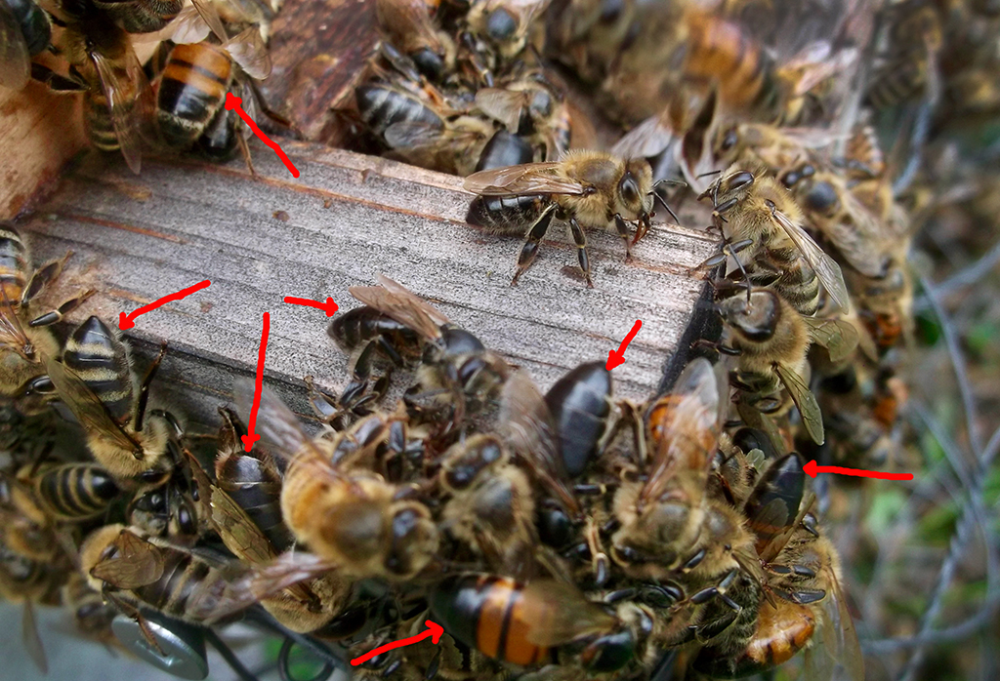

In [18]:
path="project_im/robbed.jpg"
display(Image.open(path))

#### The second one is healthy.
In Abstarct there is a photo of healthy bee. 
I definitely like this photo. 

#### The tirth one is "few varroa, hive beetles".

Here is the moment to understand differences between varroa and hive beetles.

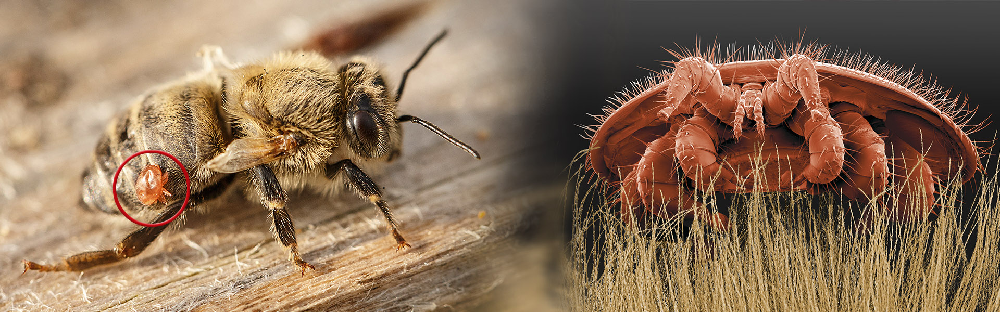

In [19]:
path="project_im/varroa.jpg"
display(Image.open(path))

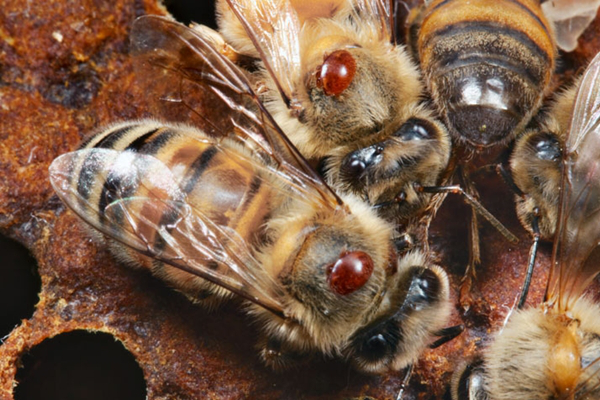

In [20]:
path="project_im/varroa-2.jpg"
display(Image.open(path))

Varroa mites feed off the fat body tissue of adult, pupal, and larval honey bees, and may carry viruses that are particularly damaging to the bees (e.g., deformed wings, and IAPV), and accordingly they have been implicated in colony collapse disorder. Research has indicated that alone, neither Varroa mites nor deformed wing virus are particularly deadly, yet together they can pose an incredible risk to colonies.

Varroa mites were first discovered in Java about 1904, but are now present in all honey bee populations except Australia, Isle of Man and northern parts of Norway. They were discovered in the United States in 1987, in New Zealand in 2000, and in the United Kingdom in 1992 (Devon).[2]

Detection
Unless special measures are taken to survey for varroa mite levels, the beekeeper may treat colonies unnecessarily or may delay treatment too long. Infested colonies may appear to be apparently healthy up to a certain mite level, but will suffer a population crash at a certain mite threshold, depending on local conditions and other factors. A beekeeper should choose an effective method of mite detection and periodically survey for pest level.
When sampling for varroa, remember that the number and location of mites in a colony vary according to time of year. The number of mites is lowest in spring, increase during the summer, and is highest in the fall. During spring and summer, most varroa are found on the brood. In late fall and winter, most mites are attached to adult worker honey bees. To get a reliable estimate of the varroa density in an apiary, beekeepers should survey at least 50 percent of the colonies. There are several varroa mite survey methods available to the beekeeper.
We can see that in first photos there is deformed wings. This is advanced stages of varroa.
The second photo shows varoa in start stage. Every beekeeper must calcu.

The genus Varroa contains these species:

Varroa destructor Anderson & Trueman, 2000 is a virulent parasite that infests its natural host, Apis cerana (Asian honey bees), on mainland Asia and also Apis mellifera (western honey bee) worldwide.
Varroa jacobsoni Oudemans, 1904 is a relatively benign parasite of Apis cerana.
Varroa rindereri de Guzman & Delfinado-Baker, 1996
Varroa sinhai (Delfinado & Baker, 1974)
Varroa wongsirii (Lekprayoon & Tangkanasing, 1991)

Worldwide distribution of varroa can be seen in the picture below

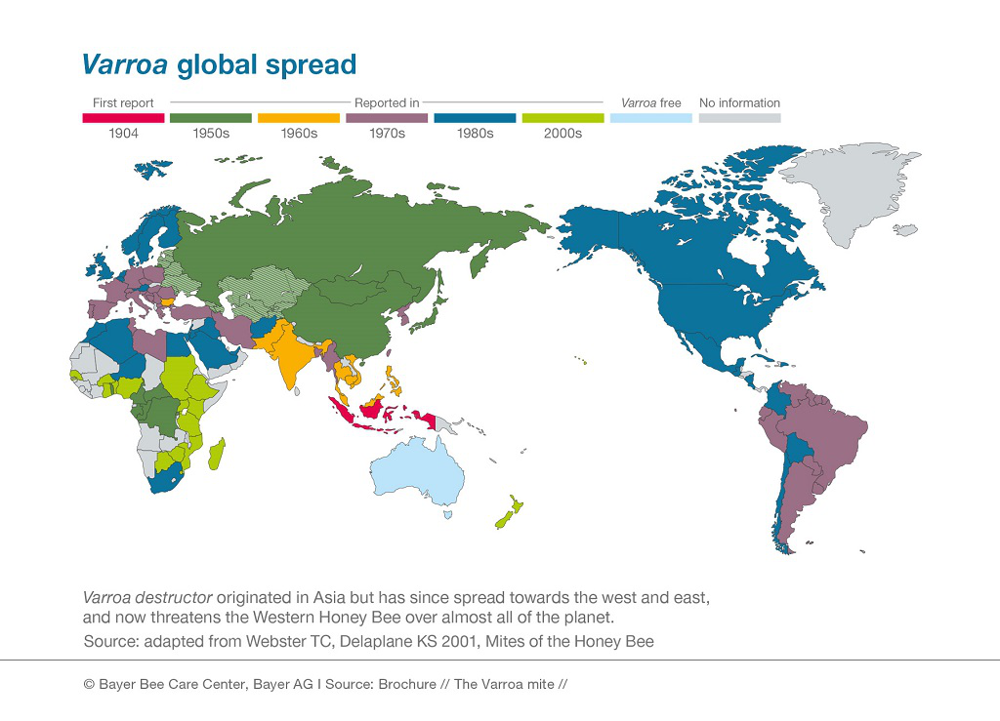

In [21]:
path="project_im/varroa_distribution.jpg"
display(Image.open(path))

#### The small hive beetle

The small hive beetle, Aethina tumida Murray, is native to sub-Saharan Africa where it is an occasional pest in colonies of African subspecies of the western honey bee, Apis mellifera Linnaeus (Hymenoptera: Apidae). However, the beetle has been found outside of its native range where it can cause considerable damage to colonies of European subspecies of honey bees. Because of its rapid spread, the small hive beetle is studied increasingly, both for its economic importance and biological significance.

Economic Importance
In its native range, the small hive beetle regularly occurs in honey bee colonies but it does not cause damage in strong, healthy colonies. In the U.S. and Australia though, small hive beetle damage in European colonies follows a characteristic pattern:

adult invasion into colonies
population build-up of small hive beetles
reproduction of small hive beetles
significant damage to brood, pollen, and honey stores by feeding small hive beetle larvae
mass exodus of larvae from the colony
pupation in the soil and
emergence as adults and subsequent re-infestation of colonies.

There is fermentation of hive products (particularly honey) associated with feeding larvae. This likely occurs due to specific yeasts associated with the small hive beetle. Honey damaged by small hive beetles is rendered foul and unfit for human consumption. Colonies heavily infested with adult small hive beetles may abscond (entirely leave the nest), although the number of adults needed to elicit this behavior often must be high (>1000 small hive beetle adults/colony).[3]

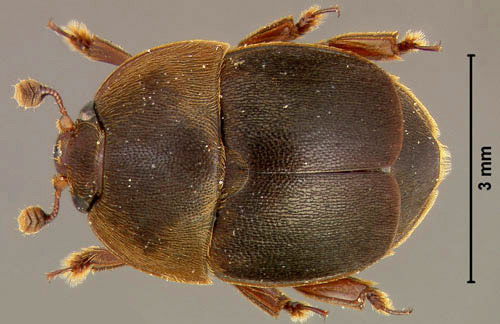

In [22]:
path="project_im/beetle_1.jpg"
display(Image.open(path))

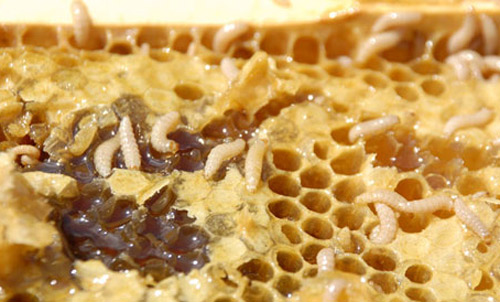

In [23]:
path="project_im/hive_beetle_larvaes.jpg"
display(Image.open(path))

Here is the big difference between varoa and small hive beetle. 
The varoa affect directly to honey bee, but the beetles and their larvaes damaged the food supply. 
That is the reason why i think that is imposible to detect small hive beetle only form photo of honey bee.

<h3><center>III.Data exploration</center></h3>

Let see how many image names there is in dataframe

In [24]:
bees_data.shape

(5172, 8)

We can see that the number of files in scv file are 5172. Let's see the number of images in image data

In [25]:
print(f"Number of all images are : {len(os.listdir(all_images_path))}")

Number of all images are : 5172


Let's see the name of images in scv file are the same in image folder

In [26]:
is_on_folder = True
for image_name in bees_data['file']:
    if image_name in os.listdir(all_images_path):
        pass
    else:
        is_on_folder = False
        
if is_on_folder:
    print("The file names in dataframe and folder are the same")
else:
    print("The file names in dataframe and folder are not the same")
        

The file names in dataframe and folder are the same


In [27]:
bees_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5172 entries, 0 to 5171
Data columns (total 8 columns):
file               5172 non-null object
date               5172 non-null object
time               5172 non-null object
location           5172 non-null object
zip code           5172 non-null int64
subspecies         5172 non-null object
health             5172 non-null object
pollen_carrying    5172 non-null bool
dtypes: bool(1), int64(1), object(6)
memory usage: 288.0+ KB


There is no null values in dataframe. Column "date" is interesting. We need to know when exactly the photos was captured.


In [28]:
bees_data['date'].unique()

array(['8/28/18', '8/6/18', '7/2/18', '8/10/18', '8/21/18', '8/20/18',
       '8/16/18', '8/13/18', '8/17/18', '8/19/18', '7/7/18', '8/25/18',
       '9/8/18', '7/3/18', '8/18/18', '8/8/18'], dtype=object)

We can see, that all of images were captured in 2018 during the July, August and September. I can easy remove the year and create 2 new columns with day and month



In [29]:
bees_data[['month','day','year']] =  bees_data['date'].str.split("/",n=2, expand=True)
bees_data =  bees_data.drop(['date', 'year'], axis=1)
bees_data.head()

,file,time,location,zip code,subspecies,health,pollen_carrying,month,day
0,041_066.png,16:07,"Alvin, TX, USA",77511,-1,hive being robbed,False,8,28
1,041_072.png,16:07,"Alvin, TX, USA",77511,-1,hive being robbed,False,8,28
2,041_073.png,16:07,"Alvin, TX, USA",77511,-1,hive being robbed,False,8,28
3,041_067.png,16:07,"Alvin, TX, USA",77511,-1,hive being robbed,False,8,28
4,041_059.png,16:07,"Alvin, TX, USA",77511,-1,hive being robbed,False,8,28


It's a good idea to do a visualization

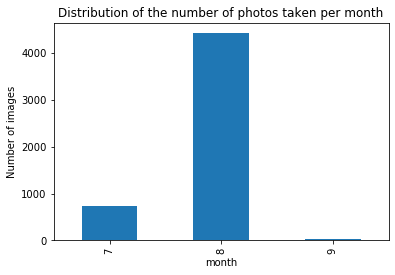

In [30]:
date_dist = bees_data.groupby('month').size()
date_dist.plot(kind='bar')
plt.title('Distribution of the number of photos taken per month')
plt.ylabel("Number of images")
plt.show()

It is easy to see that the most of images are captured during the August. In most cases august is the month with higest possible for varroa and other diseases. The reason for that is the August is the month when start the autumn fight against varroatosis in the Earth's northern hemisphere. Let's see if this is the case.



In [31]:
july_data = bees_data[bees_data['month'] == '7']
august_data = bees_data[bees_data['month'] == '8']
september_data = bees_data[bees_data['month'] == '9']

In [32]:
print(f"The distribution of health states during july are :{july_data.groupby('health').size()}")
print('===========================================================================================')
print(f"The distribution of health states during august are :{august_data.groupby('health').size()}")
print('===========================================================================================')
print(f"The distribution of health states during september are :{september_data.groupby('health').size()}")
print('===========================================================================================')

The distribution of health states during july are :health
healthy    733
dtype: int64
The distribution of health states during august are :health
Varroa, Small Hive Beetles     472
ant problems                   457
few varrao, hive beetles       579
healthy                       2651
hive being robbed              228
missing queen                   29
dtype: int64
The distribution of health states during september are :health
hive being robbed    23
dtype: int64


In [33]:
july_data_gr = july_data.groupby('health').size()
august_data_gr = august_data.groupby('health').size()
september_data_gr = september_data.groupby('health').size()

In [34]:
def Plot_distribution(grouped_data, grouped_data_index, month):
  fig = go.Figure(
    data=[go.Bar(y=grouped_data, x= grouped_data_index)],
    layout_title_text="Distribution of health state in "+month,
    )
  fig.update_layout(xaxis_title = "Health state",yaxis_title = "Number")
  fig.show()


Plot_distribution(july_data_gr, july_data_gr.index, "July")
Plot_distribution(august_data_gr, august_data_gr.index, "August")
Plot_distribution(september_data_gr, september_data_gr.index, "September")

The assumption is being confirmed. It turns out that August is the most diverse month in terms of health state. You may notice that in September there are only observations of hives who have been robbed. It can be concluded that during August the fight against varroa is give a good result, but the robbery is sensitive to food resources in nature. This is due to the already conventional farming and the lack of multicultural grazing in the area.


In [35]:
print(september_data.groupby('location').size())

location
Alvin, TX, USA    23
dtype: int64


All the September recordings are from Alvin Texas. 

In [36]:
IFrame(src='https://www.usclimatedata.com/climate/alvin/texas/united-states/ustx0027', width=1000, height=1000)


Based on US climate data, we can see that there are high average temperatures, which means that in the presence of grazing it could release nectar. 
It's not the best place for beekeeping


Let's take a look at where the photos were taken during the month with the most examples - August

In [37]:
bees_data.groupby('location').size()

location
Alvin, TX, USA           737
Athens, GA, USA          579
Athens, Georgia, USA     472
Des Moines, IA, USA      973
Keene, NH, USA            92
New Orleans, LA, USA     170
San Jose, CA, USA        149
Saratoga, CA, USA       2000
dtype: int64

Тhere is little inaccuracy in the data .Athens, Georgia, USA is written as location in 472 cases and Athens, GA, USA in 579 cases. We can assume that this is the same place. Let's correct this inaccuracy in the data. 

 
 
 

In [38]:
len(bees_data['location'].unique()) == len(bees_data['zip code'].unique())

False

In [39]:
bees_data['location'] = bees_data['location'].str.replace('Athens, Georgia, USA', 'Athens, GA, USA')
bees_data['location'].value_counts()

Saratoga, CA, USA       2000
Athens, GA, USA         1051
Des Moines, IA, USA      973
Alvin, TX, USA           737
New Orleans, LA, USA     170
San Jose, CA, USA        149
Keene, NH, USA            92
Name: location, dtype: int64

In [40]:
len(bees_data['location'].unique()) == len(bees_data['zip code'].unique())

True

In [41]:
bees_data.head()

,file,time,location,zip code,subspecies,health,pollen_carrying,month,day
0,041_066.png,16:07,"Alvin, TX, USA",77511,-1,hive being robbed,False,8,28
1,041_072.png,16:07,"Alvin, TX, USA",77511,-1,hive being robbed,False,8,28
2,041_073.png,16:07,"Alvin, TX, USA",77511,-1,hive being robbed,False,8,28
3,041_067.png,16:07,"Alvin, TX, USA",77511,-1,hive being robbed,False,8,28
4,041_059.png,16:07,"Alvin, TX, USA",77511,-1,hive being robbed,False,8,28


Perfect. Now we can preview the distribution of health status by location.

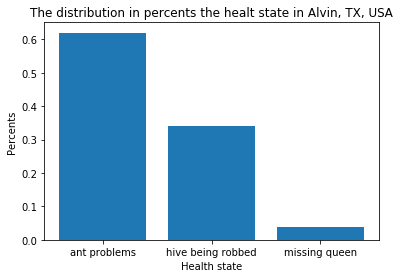

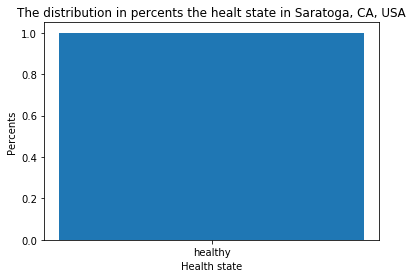

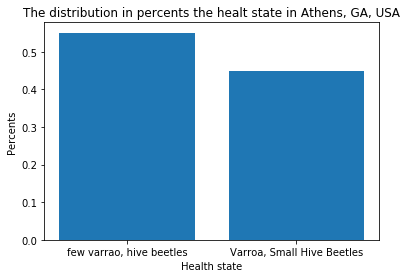

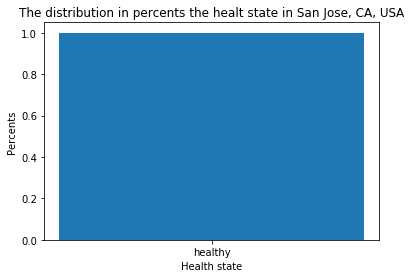

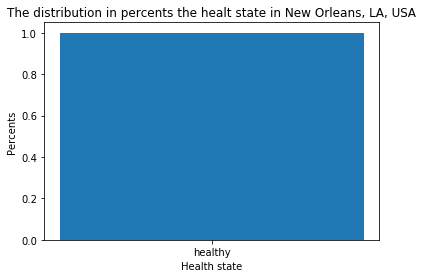

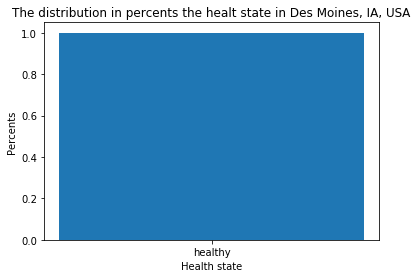

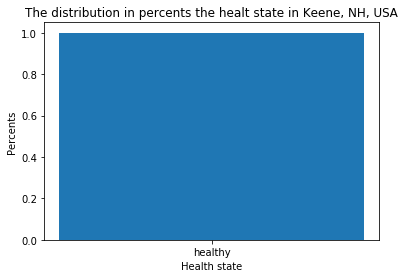

In [42]:
for location in bees_data['location'].unique():
  current = bees_data[bees_data['location'] == str(location)]
  current = current['health'].value_counts(normalize=True)
  plt.bar(current.index, current)
  plt.title("The distribution in percents the healt state in "+str(location))
  plt.xlabel("Health state")
  plt.ylabel("Percents")
  plt.show()

The graphs above show that the distribution of the different classes by location are quite different. In database, all examples of Varoatosis disease are in Athens, GA 

In [43]:
bees_data['subspecies'].value_counts(normalize=True)

Italian honey bee        0.581593
Russian honey bee        0.101895
Carniolan honey bee      0.096868
1 Mixed local stock 2    0.091261
-1                       0.082753
VSH Italian honey bee    0.038476
Western honey bee        0.007154
Name: subspecies, dtype: float64

We can see that Italian honey bee is the most comon subspecies.We are not talking about the different subspecies in this work. May be it is a good idea for future project. Good subspecies classificator will be good helper for selection of the honey bee in breeding farms.
We can look at the time column.

In [44]:
bees_data['time'] = pd.to_datetime(bees_data['time'])
bees_data['time'] = bees_data.time.dt.strftime('%H:%M')
bees_data

,file,time,location,zip code,subspecies,health,pollen_carrying,month,day
0,041_066.png,16:07,"Alvin, TX, USA",77511,-1,hive being robbed,False,8,28
1,041_072.png,16:07,"Alvin, TX, USA",77511,-1,hive being robbed,False,8,28
2,041_073.png,16:07,"Alvin, TX, USA",77511,-1,hive being robbed,False,8,28
3,041_067.png,16:07,"Alvin, TX, USA",77511,-1,hive being robbed,False,8,28
4,041_059.png,16:07,"Alvin, TX, USA",77511,-1,hive being robbed,False,8,28
...,...,...,...,...,...,...,...,...,...
5167,027_011.png,10:03,"San Jose, CA, USA",95124,-1,healthy,True,8,20
5168,027_007.png,10:03,"San Jose, CA, USA",95124,-1,healthy,True,8,20
5169,027_013.png,10:03,"San Jose, CA, USA",95124,-1,healthy,False,8,20
5170,027_012.png,10:03,"San Jose, CA, USA",95124,-1,healthy,False,8,20


In [45]:
bees_data['time'].value_counts().sort_index(ascending=True)

08:20    170
09:00    435
09:30     37
09:47     15
09:53     13
09:54     19
10:03     10
10:53     28
11:00     11
11:11      7
11:20     10
11:25     18
11:55    111
12:30    472
12:36     24
12:46    340
12:56    303
13:19    460
13:21    124
13:49     29
13:54    211
13:57    114
14:00     95
14:35     15
14:48     19
15:30    248
15:46    149
15:56    579
16:07    181
16:08     23
16:10     50
17:50    433
18:30     12
19:19    303
21:13    104
Name: time, dtype: int64

The distribution of images captured during the day shows us that most of photos was captured in second  part of the day.

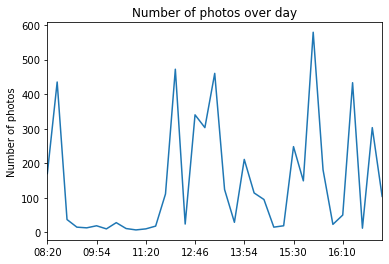

In [46]:
bees_data['time'].value_counts().sort_index(ascending=True).plot(y = 'Number of photos', use_index=True, legend = False)
plt.ylabel('Number of photos')
plt.title('Number of photos over day')
plt.show()

The distribution of images in different health state over the subspicies of honey bees

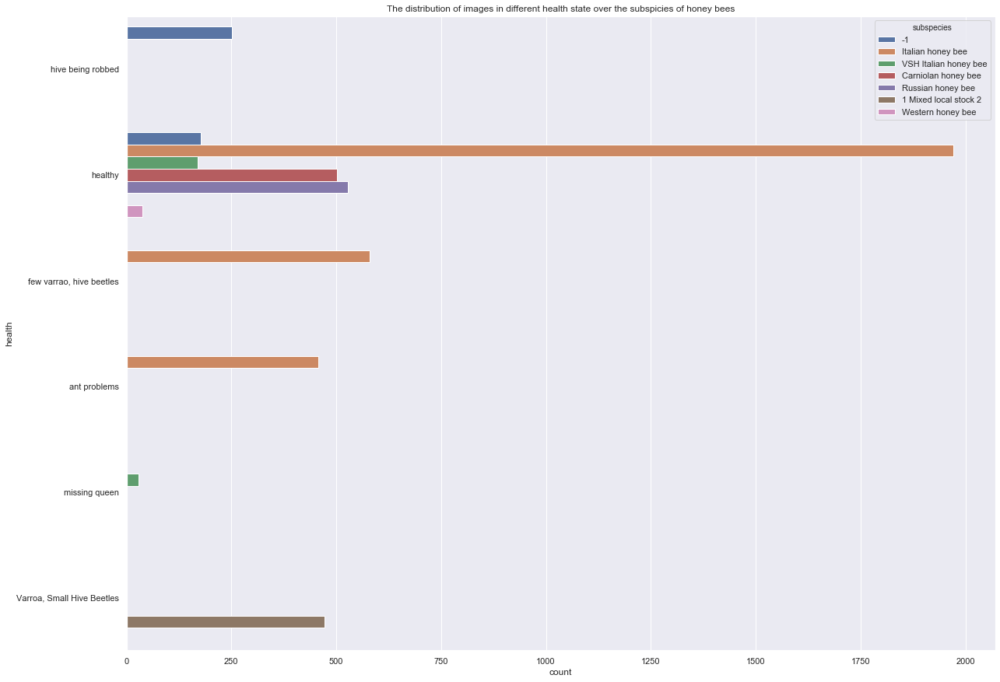

In [47]:
sns.set(style="darkgrid")
plt.figure(figsize=(20,15))
ax = sns.countplot(y="health",hue='subspecies', data=bees_data)
plt.title("The distribution of images in different health state over the subspicies of honey bees")
plt.show()

Interesting part is that in category "hive being robbed" there are no information about subscpicies.
The Italian bee is most susceptible to robbery for some scientist , but i really believe that the root cause is a beekeeper's mistake combined with a lack of grazing. The reason of most bees problem are humans. We are trying to help, but it is hard to understand complex of intelligent living organism with 135 milion years evolution.

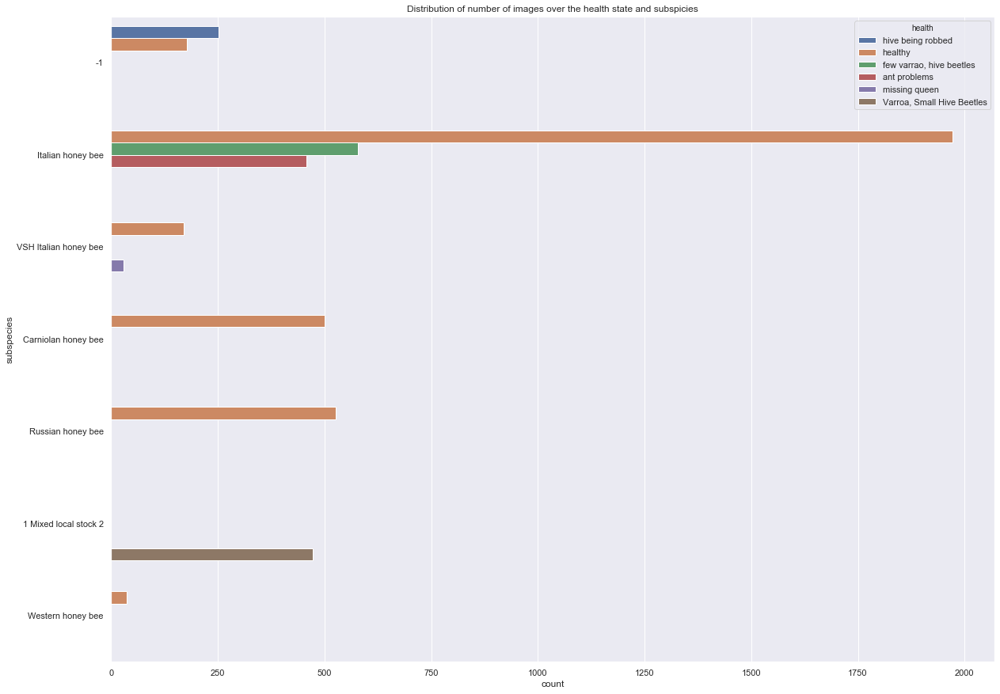

In [48]:
sns.set(style="darkgrid")
plt.figure(figsize=(20,15))
plt.title("Distribution of number of images over the health state and subspicies")
ax = sns.countplot(y="subspecies",hue='health', data=bees_data)

In [49]:
bees_data.health.unique()

array(['hive being robbed', 'healthy', 'few varrao, hive beetles',
       'ant problems', 'missing queen', 'Varroa, Small Hive Beetles'],
      dtype=object)

It is a good idea for change names of categories

In [50]:
bees_data['health'] = bees_data['health'].replace('hive being robbed','robbed')
bees_data['health'] = bees_data['health'].replace("few varrao, hive beetles", "few_varroa")
bees_data['health'] = bees_data['health'].replace("ant problems", "ant_problems")
bees_data['health'] = bees_data['health'].replace("missing queen", "missing_queen")
bees_data['health'] = bees_data['health'].replace("Varroa, Small Hive Beetles", "varroa")

In [51]:
bees_data.health.unique()

array(['robbed', 'healthy', 'few_varroa', 'ant_problems', 'missing_queen',
       'varroa'], dtype=object)

Now category looks good to continue

### 3.1. IMAGE DATA EXPLORATION

In [52]:
os.listdir('Data/bee_imgs/bee_imgs/')

['001_043.png',
 '001_044.png',
 '001_046.png',
 '001_047.png',
 '001_050.png',
 '001_051.png',
 '001_054.png',
 '001_056.png',
 '001_078.png',
 '001_082.png',
 '001_083.png',
 '001_085.png',
 '001_091.png',
 '001_092.png',
 '001_093.png',
 '001_094.png',
 '001_095.png',
 '001_096.png',
 '001_097.png',
 '001_118.png',
 '001_120.png',
 '001_121.png',
 '001_122.png',
 '001_124.png',
 '001_126.png',
 '001_127.png',
 '001_131.png',
 '001_132.png',
 '001_133.png',
 '001_134.png',
 '001_135.png',
 '001_138.png',
 '001_140.png',
 '001_144.png',
 '001_145.png',
 '001_147.png',
 '001_149.png',
 '001_151.png',
 '001_152.png',
 '001_156.png',
 '001_159.png',
 '001_160.png',
 '001_163.png',
 '001_164.png',
 '001_167.png',
 '001_168.png',
 '001_169.png',
 '001_171.png',
 '001_172.png',
 '001_173.png',
 '002_022.png',
 '002_023.png',
 '002_024.png',
 '002_026.png',
 '002_030.png',
 '002_031.png',
 '002_033.png',
 '002_034.png',
 '002_035.png',
 '002_037.png',
 '002_044.png',
 '002_046.png',
 '002_05

In [53]:
ALL_DATA_PATH = 'Data/bee_imgs/bee_imgs/'

In [54]:
len(bees_data.file.unique())

5172

In [55]:
def get_images_dimensions(data, path):
    with_alpha_list = []
    dimensions = []


    for image in data["file"]:
        if not os.path.isfile(path+image):
            continue
        current = imread(path+image).shape
        if current[2] > 3:
            try:
                with_alpha_list.append(image)
                print(current)
            except:
                pass
        else:
            dimensions.append(current)

    return dimensions, with_alpha_list

In [56]:
dimensions, with_alpha_list = get_images_dimensions(bees_data, ALL_DATA_PATH)

(75, 60, 4)
(140, 209, 4)
(156, 152, 4)
(96, 125, 4)
(49, 94, 4)
(57, 89, 4)
(59, 53, 4)
(42, 62, 4)
(49, 86, 4)
(51, 64, 4)
(64, 60, 4)
(68, 60, 4)
(67, 63, 4)
(43, 45, 4)
(46, 37, 4)
(48, 40, 4)
(43, 55, 4)
(42, 52, 4)
(47, 27, 4)
(43, 66, 4)
(46, 56, 4)
(48, 50, 4)
(86, 74, 4)
(63, 65, 4)
(44, 62, 4)
(67, 57, 4)
(62, 53, 4)
(70, 53, 4)
(70, 64, 4)
(49, 85, 4)
(154, 114, 4)


We can see that there are images with 4 channels. 

In [57]:
print(f"Number of images with transparency are {len(with_alpha_list)}")

Number of images with transparency are 31


In [58]:
dimensions[:5]

[(115, 164, 3), (201, 90, 3), (132, 167, 3), (134, 97, 3), (147, 106, 3)]

In [59]:
with_alpha_list[:5]

['016_173.png', '037_008.png', '037_009.png', '009_057.png', '009_085.png']

I think it is a good idea for remove that images. There are methods to reduce 4 channels to 3 , but for 31 images i don't think it is relevant.

In [60]:
len(bees_data)

5172

In [61]:
with_alpha = bees_data[bees_data['file'].isin(with_alpha_list)]
with_alpha['health'].value_counts()
bees_data = bees_data[~bees_data['file'].isin(with_alpha_list)]
dimensions = pd.DataFrame([*dimensions], columns = ["height", "width", "channels"])

In [62]:
len(bees_data)

5141

In [63]:
dimensions.head()

,height,width,channels
0,115,164,3
1,201,90,3
2,132,167,3
3,134,97,3
4,147,106,3


The dimensions data look good.

In [64]:
def get_best_dimension(data):
    best_height = int(data['height'].sum()/len(data))
    best_width = int(data['width'].sum()/len(data))
    chanels = 3
    return best_height, best_width, chanels
    
    
best_dimension = get_best_dimension(dimensions)
best_dimension

(72, 74, 3)

Best dimension is the mean dimension for all images.

In [65]:
import seaborn as sns

def images_size_distribution():
    with sns.axes_style('white'):
        sns.jointplot("width", "height", data=dimensions)
        #plt.xlim(0,150)
        #plt.ylim(0,400)
        plt.title("Distribution of image sizes",pad=20, loc='center')
        plt.show()

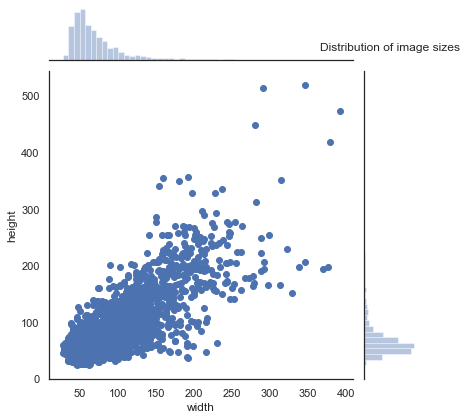

In [66]:
images_size_distribution()

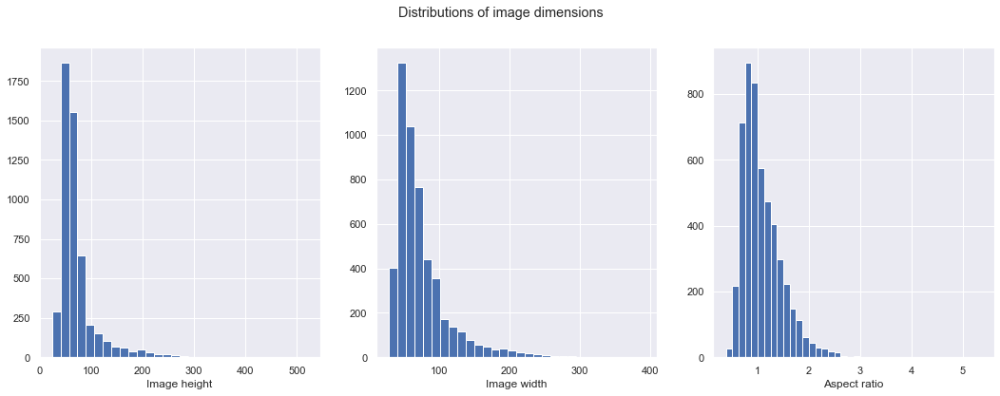

In [67]:
fig, (h_ax, w_ax, res_ax) = plt.subplots(1, 3, figsize = (18, 6))
h_ax.hist(dimensions['height'], bins = 30)
h_ax.set_xlabel("Image height")

w_ax.hist(dimensions['width'], bins = 30)
w_ax.set_xlabel("Image width")

res_ax.hist(dimensions['width'] / dimensions['height'], bins = 40)
res_ax.set_xlabel("Aspect ratio")

plt.suptitle("Distributions of image dimensions")
plt.show()

Most of the images are with equal width and height

### 3.1.1. Set data to category directories

In [68]:
DATA_CATGORY_PATH = 'Data/bee_imgs/bee_imgs/'
CREATE_CATEGORY_PATH = 'Data/bee_imgs/'

try:
    os.mkdir(CREATE_CATEGORY_PATH+"Training_img/")
except:
    pass
TRAINING_PATH = "Data/bee_imgs/Training_img/"

for health_state in bees_data['health'].unique():
    try:    
        os.mkdir(TRAINING_PATH+str(health_state))
        print(f"Create category '{health_state}' and copy images correspond to this category")
        for image in bees_data[bees_data["health"] == str(health_state)]['file']:
            copyfile(DATA_CATGORY_PATH+str(image),TRAINING_PATH+str(health_state)+"/"+str(image))
    except:
        print(f"Already created '{health_state}' directory.")
    
    

Create category 'robbed' and copy images correspond to this category
Create category 'healthy' and copy images correspond to this category
Create category 'few_varroa' and copy images correspond to this category
Create category 'ant_problems' and copy images correspond to this category
Create category 'missing_queen' and copy images correspond to this category
Create category 'varroa' and copy images correspond to this category


"Training_img" is not good name of root directory, but soon it will remove and the name it doesn't matter. We can visualize images from different categories.

In [69]:
def Show_iamges(num_im, category=None):
    # Select first X subspecies titles 
    categories = bees_data['health'].unique()
    f, ax = plt.subplots(nrows=1,ncols=num_im, figsize=(12,3))
    i=0
    # Draw the first found bee of given subpecies
    for cat in categories:
        if (cat != category or category == None): continue
        for image in os.listdir(TRAINING_PATH + category + "/"):
            file = TRAINING_PATH + category + "/" + image
            im=imageio.imread(file)
            ax[i].imshow(im, resample=True)
            ax[i].set_title(category, fontsize=8)
            i+=1
            if i == num_im:
                break

    plt.suptitle(f"Bee images from class {category}", y = 1.2)
    plt.tight_layout()
    plt.show()

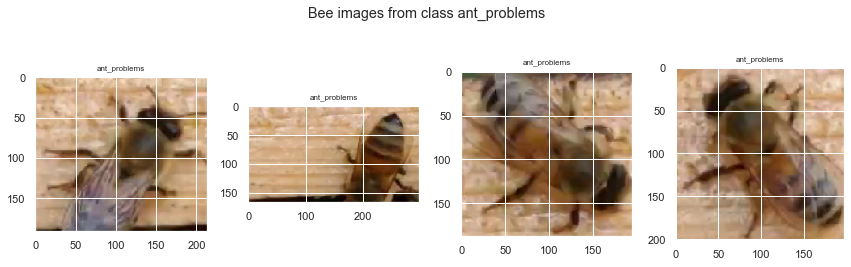

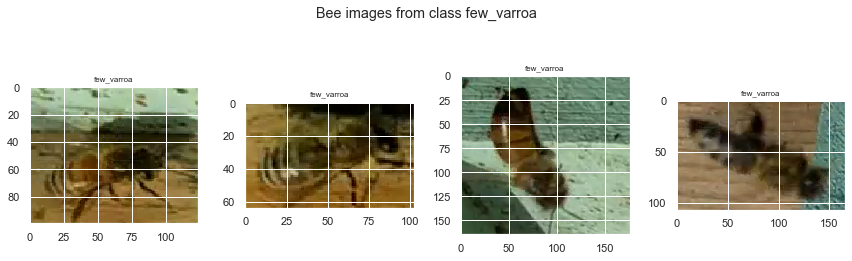

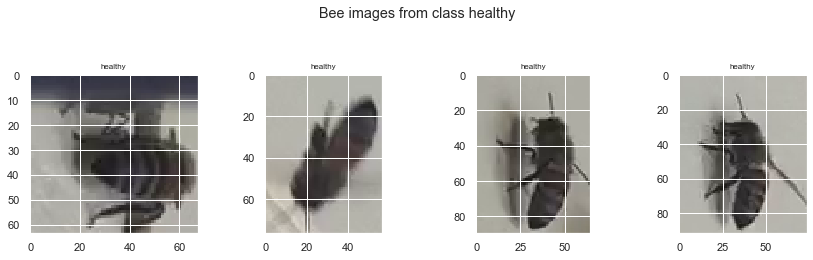

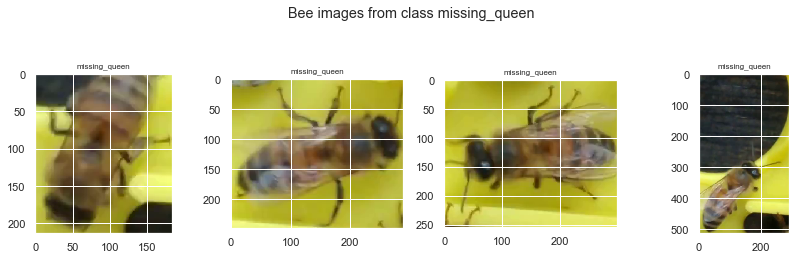

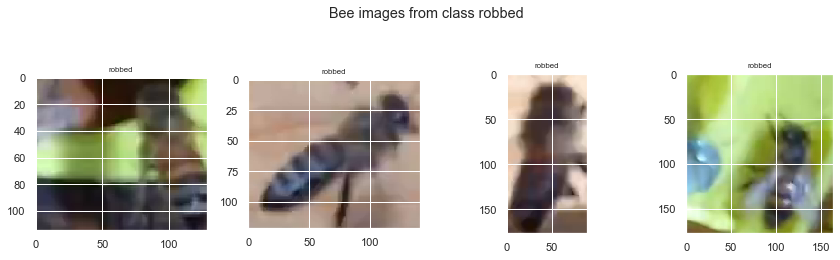

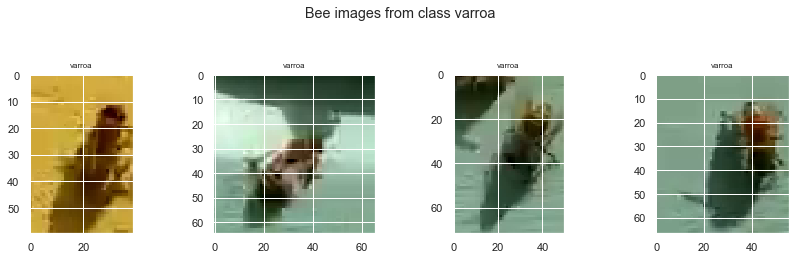

In [70]:
for category in os.listdir(TRAINING_PATH):
    Show_iamges(4, category)

The distribution of number of images over categories is good to see.

In [71]:
def category_distribution():
    for category in bees_data["health"].unique():
        photos_num = len(bees_data[bees_data["health"] == category])
        print(f"Number of images for category {category} are {photos_num}")
    

In [72]:
category_distribution()

Number of images for category robbed are 249
Number of images for category healthy are 3362
Number of images for category few_varroa are 579
Number of images for category ant_problems are 457
Number of images for category missing_queen are 29
Number of images for category varroa are 465


Number of images for category missing_queen are 29. I see the identical background. It is good idea to see more examples form this class

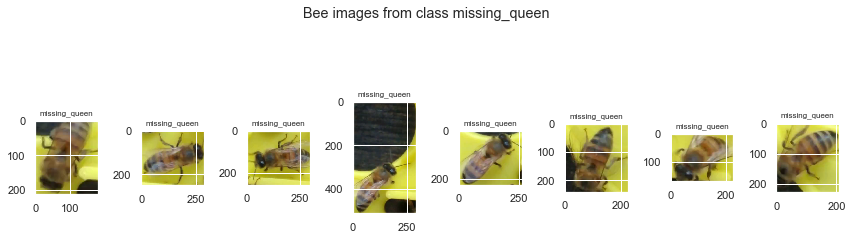

In [73]:
Show_iamges(8, "missing_queen")

As you can see, almost all photos have the same background, which at the same time differs significantly from the backgrounds from different categories. I do not think the information provided by the photos in this category is appropriate for training an algorithm that recognizes this particular class. Due to the small number of examples and the same background, I believe that the model will learn the background, even if it handles high performance, which does not make it a model suitable for real data. For this reason, I will remove this class


In [74]:
len(bees_data)

5141

In [75]:
bees_data = bees_data[bees_data['health'] != "missing_queen"]

In [76]:
len(bees_data)

5112

It is time to delete the images and in this category

In [77]:
missing_queen_path = "Data/bee_imgs/Training_img/missing_queen/"
shutil.rmtree(missing_queen_path, ignore_errors=True)

In [78]:
category_distribution()

Number of images for category robbed are 249
Number of images for category healthy are 3362
Number of images for category few_varroa are 579
Number of images for category ant_problems are 457
Number of images for category varroa are 465


It looks better now. Let's create dataframe with image names and categories.

In [79]:
filenames = bees_data[["file", "health"]]
filenames.head()

,file,health
0,041_066.png,robbed
1,041_072.png,robbed
2,041_073.png,robbed
3,041_067.png,robbed
4,041_059.png,robbed


### 3.1.2. Splitting images to train validation and test data

In [80]:
best_dimension

(72, 74, 3)

We know best dimmention that calculate before, but I think to set image size to (70, 70)

In [81]:
DATA_DIR = "data"
SPLITS_DIR = "splits"

TRAIN_PCT, VAL_PCT, TEST_PCT = 0.86, 0.07, 0.07

IMAGE_SIZE = (70, 70)
BATCH_SIZE = 32

In [82]:
train_data, val_data, test_data = pd.DataFrame(), pd.DataFrame(), pd.DataFrame()

for class_name, data in filenames.groupby("health"):
    # Randomize the order (shuffle) before splitting
    data = data.sample(frac = 1)
    train_end_index, val_end_index = round(TRAIN_PCT * len(data)), round((TRAIN_PCT + VAL_PCT) * len(data))
    train_data_in_class, val_data_in_class, test_data_in_class = data[:train_end_index], data[train_end_index: val_end_index], data[val_end_index:]
    train_data = pd.concat([train_data, train_data_in_class])
    val_data = pd.concat([val_data, val_data_in_class])
    test_data = pd.concat([test_data, test_data_in_class])
    
# Randomize the sets once again so the classes are not consecutive
train_data = train_data.sample(frac = 1)
val_data = val_data.sample(frac = 1)
test_data = test_data.sample(frac = 1)

if not os.path.exists(SPLITS_DIR):
    os.makedirs(SPLITS_DIR)
    
for dataset, filename in zip([train_data, val_data, test_data], ["train", "val", "test"]):
    dataset.to_csv(os.path.join(SPLITS_DIR, filename + ".csv"), index = False)

Now we have information for train test and validation data saved in csv files. 

In [83]:
train_data = pd.read_csv(os.path.join(SPLITS_DIR, "train.csv"))
val_data = pd.read_csv(os.path.join(SPLITS_DIR, "val.csv"))
test_data = pd.read_csv(os.path.join(SPLITS_DIR, "test.csv"))

In [84]:
print(f"Train data shape is : {train_data.shape}")
print(f"Validation data shape is : {val_data.shape}")
print(f"Test data shape is : {test_data.shape}")

Train data shape is : (4396, 2)
Validation data shape is : (358, 2)
Test data shape is : (358, 2)


It is time to move all images to coresponding category devided in train test and validation root directory. This will be useful for training later.

In [85]:
train_data.head()

,file,health
0,040_536.png,few_varroa
1,038_005.png,varroa
2,010_536.png,healthy
3,015_1167.png,healthy
4,003_187.png,healthy


In [86]:
data_path = "Data/bee_imgs/"
training_path = data_path + "Training_data/" 
validation_path = data_path + "Validation_data/"
testing_path = data_path + "Testing_data/"

In [87]:
def create_category( create_dir_path, data):
    os.mkdir(create_dir_path)
    current_path = create_dir_path
    for label in data["health"].unique():
        ss = current_path + label + "/"
        print(ss)
        os.mkdir(ss)
        
create_category(training_path, train_data)
create_category(validation_path, val_data)
create_category(testing_path, test_data)


Data/bee_imgs/Training_data/few_varroa/
Data/bee_imgs/Training_data/varroa/
Data/bee_imgs/Training_data/healthy/
Data/bee_imgs/Training_data/ant_problems/
Data/bee_imgs/Training_data/robbed/
Data/bee_imgs/Validation_data/ant_problems/
Data/bee_imgs/Validation_data/healthy/
Data/bee_imgs/Validation_data/varroa/
Data/bee_imgs/Validation_data/few_varroa/
Data/bee_imgs/Validation_data/robbed/
Data/bee_imgs/Testing_data/healthy/
Data/bee_imgs/Testing_data/varroa/
Data/bee_imgs/Testing_data/few_varroa/
Data/bee_imgs/Testing_data/robbed/
Data/bee_imgs/Testing_data/ant_problems/


After we have categories directories we need to move all files there.

In [88]:
def move_files(data, path):
    count = 0
    for file, label in data.itertuples(index=False):
        file = TRAINING_PATH + label + "/" + file
        shutil.move(file, path + label + "/")
        count += 1
    print(f"Number of images moved : {count}")
    
move_files(train_data, training_path)
move_files(test_data, testing_path)
move_files(val_data, validation_path)

Number of images moved : 4396
Number of images moved : 358
Number of images moved : 358


In [89]:
shutil.rmtree("Data/bee_imgs/Training_img/", ignore_errors=True)

In [90]:
def distribution():    
    data_path = "Data/bee_imgs/"

    train_dir = os.path.join(data_path, "Training_data/")
    test_dir = os.path.join(data_path, "Testing_data/")
    validation_dir = os.path.join(data_path, "Validation_data")

    for type_data in os.listdir(data_path):
        if type_data == "bee_imgs":
            continue
        current_data_path = os.path.join(data_path, (type_data+"/"))
        num_class = 0
        for label in os.listdir(current_data_path):
            current_label_path = os.path.join(current_data_path, (label + "/"))
            len_dir = len(os.listdir(current_label_path))
            num_image = 0
            for image in os.listdir(current_label_path):
                num_image += 1
            print(f"For label {label} there are {num_image} images for {type_data}")
            num_class +=len_dir
        globals()[f"{type_data}_len"] = num_class
        print(f"Number of images for {type_data}: {num_class}")
        print("")

In [91]:
distribution()

For label ant_problems there are 32 images for Testing_data
For label few_varroa there are 41 images for Testing_data
For label healthy there are 235 images for Testing_data
For label robbed there are 17 images for Testing_data
For label varroa there are 33 images for Testing_data
Number of images for Testing_data: 358

For label ant_problems there are 393 images for Training_data
For label few_varroa there are 498 images for Training_data
For label healthy there are 2891 images for Training_data
For label robbed there are 214 images for Training_data
For label varroa there are 400 images for Training_data
Number of images for Training_data: 4396

For label ant_problems there are 32 images for Validation_data
For label few_varroa there are 40 images for Validation_data
For label healthy there are 236 images for Validation_data
For label robbed there are 18 images for Validation_data
For label varroa there are 32 images for Validation_data
Number of images for Validation_data: 358



There are several methods to balance classes. Oversampling, Undersampling, SMOTE.
I will use regular oversampling using random copy of images from minority classes until reach numbers of images of majority class.

In [92]:
def ballanced_classes(folder_path, num_needed_img):
    images = [os.path.join(folder_path, f) for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]
    copy_files = 0
    while copy_files < num_needed_img:
        image_path = random.choice(images)
        image = imread(image_path)
        new_path = '%scopy_%s.png' % (folder_path, copy_files)
        imsave(new_path, image)
        copy_files += 1
        
def Get_max_cat(type_data_path):
    max_num = -1
    for category in os.listdir(type_data_path):
        current_category = type_data_path + category + "/"
        current_len = len(os.listdir(current_category))
        if current_len > max_num:
            max_num = current_len
    
    return max_num       

In [93]:
train_dir = "Data/bee_imgs/Training_data/"
validation_dir = "Data/bee_imgs/Validation_data/"
test_dir = "Data/bee_imgs/Testing_data/"

In [94]:
current_path = train_dir
max_label_num = Get_max_cat(current_path)
for label in os.listdir(current_path):
    current_len = len(os.listdir(current_path + label + "/"))
    current_label_path = current_path + label + "/"
    ballanced_classes(current_label_path, max_label_num - current_len)

    

In [95]:
distribution()

For label ant_problems there are 32 images for Testing_data
For label few_varroa there are 41 images for Testing_data
For label healthy there are 235 images for Testing_data
For label robbed there are 17 images for Testing_data
For label varroa there are 33 images for Testing_data
Number of images for Testing_data: 358

For label ant_problems there are 2891 images for Training_data
For label few_varroa there are 2891 images for Training_data
For label healthy there are 2891 images for Training_data
For label robbed there are 2891 images for Training_data
For label varroa there are 2891 images for Training_data
Number of images for Training_data: 14455

For label ant_problems there are 32 images for Validation_data
For label few_varroa there are 40 images for Validation_data
For label healthy there are 236 images for Validation_data
For label robbed there are 18 images for Validation_data
For label varroa there are 32 images for Validation_data
Number of images for Validation_data: 358


Cool, now we have balanced training data. Now it is time to create generators for train test and validation data.

### 3.1.3 PREPARE DATA FOR TRAINING

In [96]:
test_dir

'Data/bee_imgs/Testing_data/'

In [97]:
def generate_data_cnn(batch_size, img_size, augumentation):

    if augumentation == True:
        train_datagen = ImageDataGenerator(rescale=1./255,
                            rotation_range=40,
                            shear_range=0.2,
                            zoom_range=0.2,
                            width_shift_range=0.2,
                            height_shift_range=0.2,
                            horizontal_flip = True,
                            fill_mode = 'nearest')
    else:
        train_datagen = ImageDataGenerator(rescale=1./255)
        

    val_datagen = ImageDataGenerator(rescale=1./255)

    test_datagen = ImageDataGenerator(rescale=1./255)

    train_data_generator = train_datagen.flow_from_directory(batch_size=batch_size,
                                                               directory=train_dir,
                                                               shuffle=True,
                                                               target_size=(img_size),
                                                               class_mode='categorical')



    val_data_generator = val_datagen.flow_from_directory(batch_size=batch_size,
                                                                  directory=validation_dir,
                                                                shuffle=True,
                                                                  target_size=(img_size),
                                                                  class_mode='categorical')

    test_data_generator = test_datagen.flow_from_directory(directory=test_dir,
                                                               target_size=(img_size),
                                                                batch_size = 1,
                                                                shuffle = False,
                                                               class_mode="categorical")
    return train_data_generator, val_data_generator, test_data_generator, batch_size

In [98]:
tr, val, test, batch = generate_data_cnn(32, (70,70), False)
tr_au, val_au, test_au, batch_au = generate_data_cnn(32, (70,70), True)

Found 14455 images belonging to 5 classes.
Found 358 images belonging to 5 classes.
Found 358 images belonging to 5 classes.
Found 14455 images belonging to 5 classes.
Found 358 images belonging to 5 classes.
Found 358 images belonging to 5 classes.


In [99]:
sample_training_images, _ = next(tr)
sample_training_images_au, _ = next(tr_au)

In [100]:
def plotImages(images_arr):
    fig, axes = plt.subplots(1, 5, figsize=(20,20))
    axes = axes.flatten()
    print("First 5 training images")
    for img, ax in zip( images_arr, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()
    


First 5 images without augumentation

First 5 training images


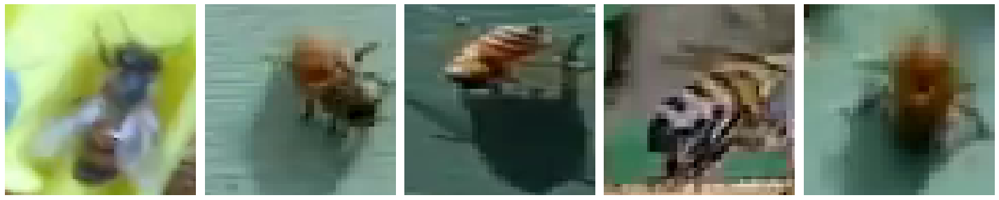

In [101]:
plotImages(sample_training_images[:5])

First 5 images with augumentatiton

First 5 training images


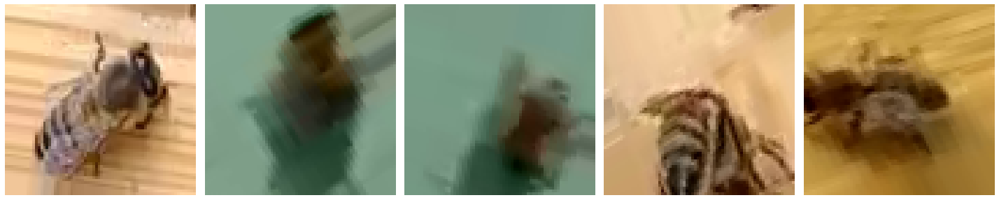

In [102]:
plotImages(sample_training_images_au[:5])

<h3><center>IV.TRAINING AND TESTING</center></h3>

In [223]:
train_data_generator_1, val_data_generator_1, test_data_generator_1, batch_size_1 = generate_data_cnn(32, (70,70), False)

Found 11765 images belonging to 5 classes.
Found 767 images belonging to 5 classes.
Found 767 images belonging to 5 classes.


In [146]:
classifier_1 = Sequential(name="model_3")

classifier_1.add(Conv2D(32, (3,3), activation='relu', padding='same', input_shape=(70,70,3)))
classifier_1.add(MaxPool2D((2,2),name='block0_pool1'))

classifier_1.add( Conv2D(64,(3,3), activation='relu', padding='same', name='block1_conv1'))
classifier_1.add(MaxPool2D((2,2),name='block1_pool1'))

classifier_1.add(Flatten())

classifier_1.add(Dense(512, activation='relu'))  
classifier_1.add(Dropout(0.1, name="Dropout_1"))
classifier_1.add(Dense(128, activation='relu'))  
classifier_1.add(Dropout(0.1, name="Dropout_2"))
classifier_1.add(Dense(5, activation = "softmax"))

    

In [147]:
classifier_1.summary()

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_6 (Conv2D)            (None, 70, 70, 32)        896       
_________________________________________________________________
block0_pool1 (MaxPooling2D)  (None, 35, 35, 32)        0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 35, 35, 64)        18496     
_________________________________________________________________
block1_pool1 (MaxPooling2D)  (None, 17, 17, 64)        0         
_________________________________________________________________
flatten_5 (Flatten)          (None, 18496)             0         
_________________________________________________________________
dense_14 (Dense)             (None, 512)               9470464   
_________________________________________________________________
Dropout_1 (Dropout)          (None, 512)               0   

In [152]:
classifier_1.compile(optimizer = Adam(learning_rate = 0.001),
              loss = CategoricalCrossentropy(),
              metrics = [CategoricalAccuracy()])

In [153]:
tensorboard_c_1 = TensorBoard(log_dir='logs\c_1')

In [154]:
epochs = 30

In [572]:
train_data_generator_cl_1, val_data_generator_cl_1, test_data_generator_cl_1, batch_size_cl_1 = generate_data_cnn(32, (70,70), False)

Found 14455 images belonging to 5 classes.
Found 358 images belonging to 5 classes.
Found 358 images belonging to 5 classes.


In [156]:
history_1 = classifier_1.fit_generator(
        train_data_generator_cl_1,
        steps_per_epoch=int(Training_data_len/batch_size_cl_1),
        epochs=epochs,
        validation_data=val_data_generator_cl_1,
        validation_steps=int(Validation_data_len/batch_size_cl_1),
        callbacks= [tensorboard_c_1])

Epoch 1/30
367/367 [==============================] - 252s 687ms/step - loss: 0.5029 - categorical_accuracy: 0.7782 - val_loss: 0.2922 - val_categorical_accuracy: 0.8859
Epoch 2/30
367/367 [==============================] - 254s 692ms/step - loss: 0.1187 - categorical_accuracy: 0.9550 - val_loss: 0.3323 - val_categorical_accuracy: 0.8981
Epoch 3/30
367/367 [==============================] - 253s 690ms/step - loss: 0.0450 - categorical_accuracy: 0.9855 - val_loss: 0.2816 - val_categorical_accuracy: 0.9321
Epoch 4/30
367/367 [==============================] - 253s 691ms/step - loss: 0.0218 - categorical_accuracy: 0.9931 - val_loss: 0.2309 - val_categorical_accuracy: 0.9293
Epoch 5/30
367/367 [==============================] - 256s 699ms/step - loss: 0.0245 - categorical_accuracy: 0.9922 - val_loss: 0.2329 - val_categorical_accuracy: 0.9416
Epoch 6/30
367/367 [==============================] - 253s 691ms/step - loss: 0.0036 - categorical_accuracy: 0.9990 - val_loss: 0.3290 - val_categoric

In [158]:
os.mkdir("Models/")

In [159]:
models_path = "Models/"

In [163]:
classifier_1.save(models_path + "classifier_1.h5")

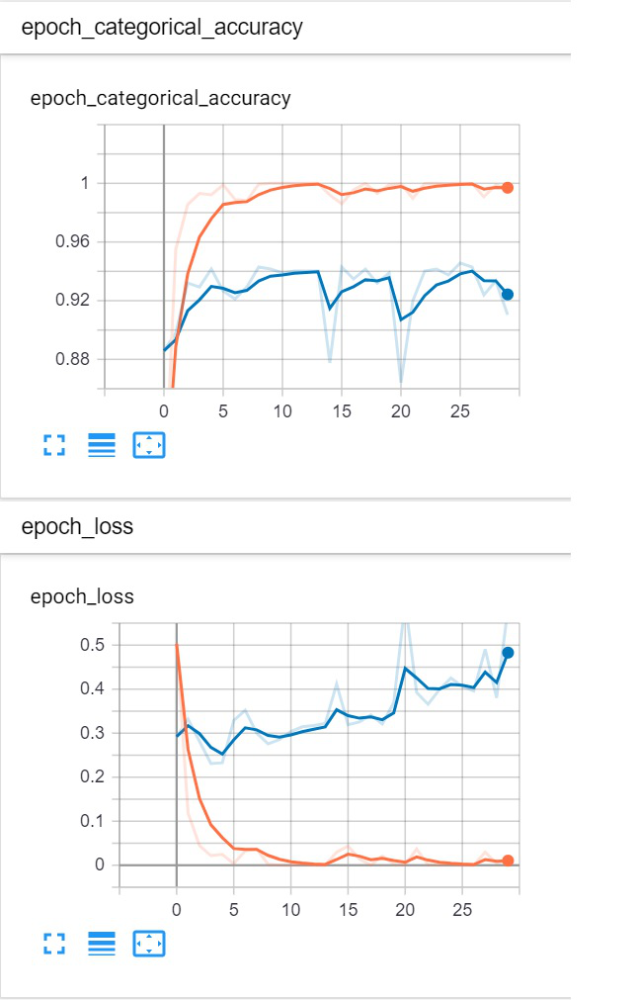

In [556]:
path="project_im/c_1_loss_accuracy.jpg"
display(Image.open(path))

The orange curve represent training accuracy and loss and the blue one represent validation accuracy and loss. Here is not hard to say that this model is totaly overfit in first epoch. This is not good. This model can't generalize at all. The reason for this is not one, but let's try to put some augumentation of the images before put them in model.

In [164]:
classifier_2 = classifier_1

In [166]:
classifier_2.summary()

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_6 (Conv2D)            (None, 70, 70, 32)        896       
_________________________________________________________________
block0_pool1 (MaxPooling2D)  (None, 35, 35, 32)        0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 35, 35, 64)        18496     
_________________________________________________________________
block1_pool1 (MaxPooling2D)  (None, 17, 17, 64)        0         
_________________________________________________________________
flatten_5 (Flatten)          (None, 18496)             0         
_________________________________________________________________
dense_14 (Dense)             (None, 512)               9470464   
_________________________________________________________________
Dropout_1 (Dropout)          (None, 512)               0   

In [167]:
classifier_2.compile(optimizer = Adam(learning_rate = 0.001),
              loss = CategoricalCrossentropy(),
              metrics = [CategoricalAccuracy()])

In [168]:
tensorboard_c_2 = TensorBoard(log_dir='logs\c_2')

In [169]:
epochs = 30

In [573]:
train_data_generator_cl_2, val_data_generator_cl_2, test_data_generator_cl_2, batch_size_cl_2 = generate_data_cnn(32, (70,70), True)

Found 14455 images belonging to 5 classes.
Found 358 images belonging to 5 classes.
Found 358 images belonging to 5 classes.


In [171]:
history_2 = classifier_2.fit_generator(
        train_data_generator_cl_2,
        steps_per_epoch=int(Training_data_len/batch_size_cl_2),
        epochs=epochs,
        validation_data=val_data_generator_cl_2,
        validation_steps=int(Validation_data_len/batch_size_cl_2),
        callbacks= [tensorboard_c_2])

Epoch 1/30
367/367 [==============================] - 275s 750ms/step - loss: 0.4663 - categorical_accuracy: 0.8134 - val_loss: 0.1629 - val_categorical_accuracy: 0.9334
Epoch 2/30
367/367 [==============================] - 267s 728ms/step - loss: 0.2526 - categorical_accuracy: 0.8891 - val_loss: 0.1768 - val_categorical_accuracy: 0.9348
Epoch 3/30
367/367 [==============================] - 261s 711ms/step - loss: 0.2107 - categorical_accuracy: 0.9098 - val_loss: 0.1839 - val_categorical_accuracy: 0.9130
Epoch 4/30
367/367 [==============================] - 261s 710ms/step - loss: 0.1812 - categorical_accuracy: 0.9223 - val_loss: 0.1063 - val_categorical_accuracy: 0.9579
Epoch 5/30
367/367 [==============================] - 259s 707ms/step - loss: 0.1668 - categorical_accuracy: 0.9313 - val_loss: 0.1307 - val_categorical_accuracy: 0.9416
Epoch 6/30
367/367 [==============================] - 271s 740ms/step - loss: 0.1616 - categorical_accuracy: 0.9305 - val_loss: 0.2635 - val_categoric

In [186]:
classifier_2.save(models_path + "classifier_2.h5")

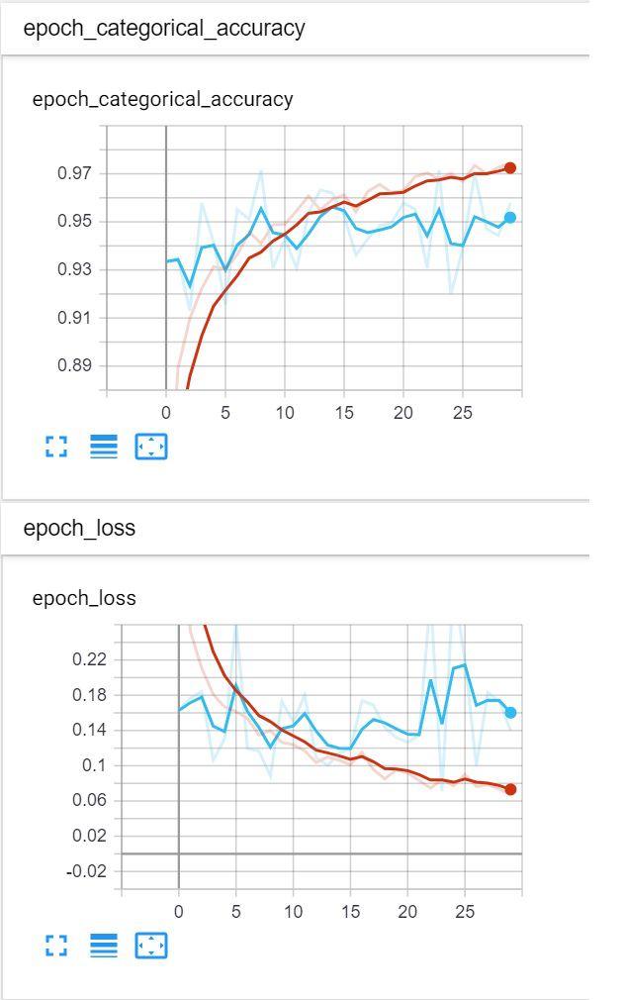

In [557]:
path="project_im/c_2_loss_accuracy.jpg"
display(Image.open(path))

Augumentation does good work, but still this model overfit before 10 th epohs. This time it si good idea to change the learning rate of Adam optimizer. Next model shows how good is it with smaller learning rate. This time using the function may be is good choise.


In [201]:
def build_model(lr):
    model = Sequential()
    model.add(Conv2D(32, (3,3), activation='relu', padding='same', input_shape=(70,70,3)))
    model.add(MaxPool2D((2,2),name='block0_pool1'))

    model.add( Conv2D(64,(3,3), activation='relu', padding='same', name='block1_conv1'))
    model.add(MaxPool2D((2,2),name='block1_pool1'))

    model.add(Flatten())

    model.add(Dense(512, activation='relu'))  
    model.add(Dropout(0.1, name="Dropout_1"))
    model.add(Dense(128, activation='relu'))  
    model.add(Dropout(0.1, name="Dropout_2"))
    model.add(Dense(5, activation = "softmax"))
    
    model.compile(optimizer = Adam(learning_rate = lr),
              loss = CategoricalCrossentropy(),
              metrics = [CategoricalAccuracy()])

    return model
   
    
    

In [202]:
classifier_3 = build_model(0.0001)

In [574]:
 train_data_generator_cl_3, val_data_generator_cl_3, test_data_generator_cl_3, batch_size_cl_3 = generate_data_cnn(32, (70,70), True)

Found 14455 images belonging to 5 classes.
Found 358 images belonging to 5 classes.
Found 358 images belonging to 5 classes.


In [204]:
tensorboard_c_3 = TensorBoard(log_dir='logs\c_3')

In [205]:
history_3 = classifier_3.fit_generator(
        train_data_generator_cl_3,
        steps_per_epoch=int(Training_data_len/batch_size_cl_3),
        epochs=epochs,
        validation_data=val_data_generator_cl_3,
        validation_steps=int(Validation_data_len/batch_size_cl_3),
        callbacks= [tensorboard_c_3])

Epoch 1/30
367/367 [==============================] - 268s 731ms/step - loss: 0.9335 - categorical_accuracy: 0.5932 - val_loss: 0.8158 - val_categorical_accuracy: 0.6739
Epoch 2/30
367/367 [==============================] - 274s 745ms/step - loss: 0.5069 - categorical_accuracy: 0.7566 - val_loss: 0.5227 - val_categorical_accuracy: 0.7636
Epoch 3/30
367/367 [==============================] - 271s 739ms/step - loss: 0.4047 - categorical_accuracy: 0.8030 - val_loss: 0.4982 - val_categorical_accuracy: 0.8030
Epoch 4/30
367/367 [==============================] - 263s 717ms/step - loss: 0.3571 - categorical_accuracy: 0.8316 - val_loss: 0.3296 - val_categorical_accuracy: 0.8655
Epoch 5/30
367/367 [==============================] - 266s 724ms/step - loss: 0.3232 - categorical_accuracy: 0.8518 - val_loss: 0.2054 - val_categorical_accuracy: 0.9185
Epoch 6/30
367/367 [==============================] - 264s 719ms/step - loss: 0.2965 - categorical_accuracy: 0.8646 - val_loss: 0.3582 - val_categoric

In [206]:
classifier_3.save(models_path + "classifier_3.h5")

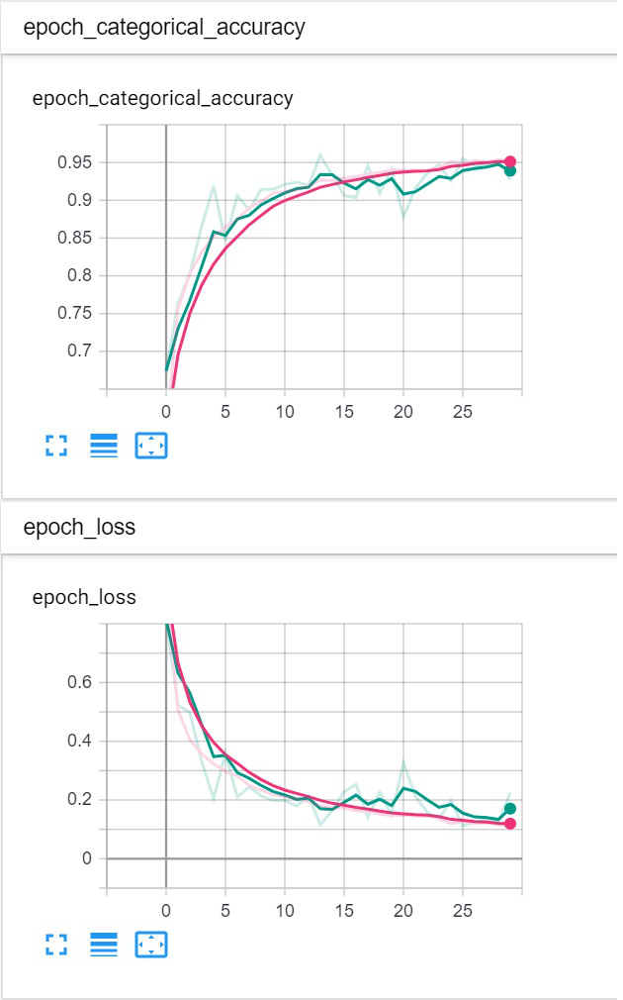

In [558]:
path="project_im/c_3_loss_accuracy.jpg"
display(Image.open(path))

This model is pretty good compare to oothers 2. I am not sure, but i think may be near 28 epohs there is behavior like it is gonna overfit. Let's see how good is this model with testing images.

In [575]:
filenames = test_data_generator_cl_3.filenames

In [576]:
ground_truth = test_data_generator_cl_3.classes

In [ ]:
test_data_generator_cl_3

In [577]:
label2index = test_data_generator_cl_3.class_indices
label2index

{'ant_problems': 0, 'few_varroa': 1, 'healthy': 2, 'robbed': 3, 'varroa': 4}

In [578]:
idx2label = dict((v,k) for k,v in label2index.items())
idx2label

{0: 'ant_problems', 1: 'few_varroa', 2: 'healthy', 3: 'robbed', 4: 'varroa'}

In [579]:
test_data_generator_cl_3.n

358

In [580]:
predictions = classifier_3.predict_generator(test_data_generator_cl_3, steps=test_data_generator_cl_3.samples/test_data_generator_cl_3.batch_size,verbose=1)
predicted_classes = np.argmax(predictions,axis=1)

358/358 [==============================] - 16s 44ms/step


In [581]:
errors = np.where(predicted_classes != ground_truth)[0]
print("No of errors = {}/{}".format(len(errors),test_data_generator_cl_3.samples))
 

No of errors = 23/358


In [582]:
test_path = "Data/bee_imgs/Testing_data/"

In [583]:
from tensorflow.keras.preprocessing import image

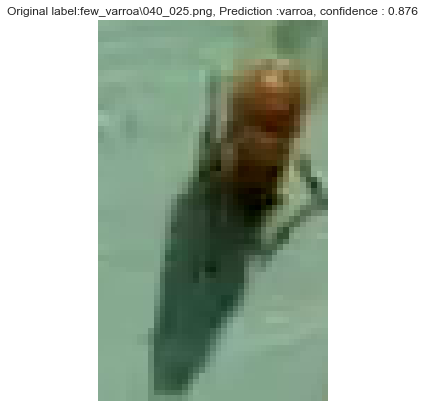

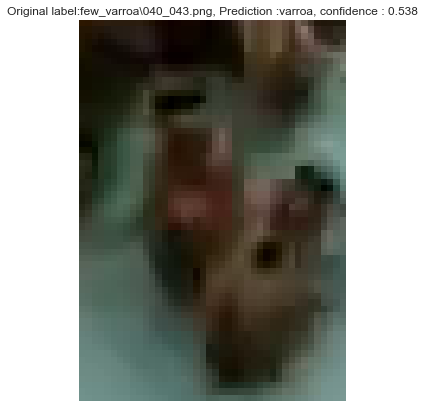

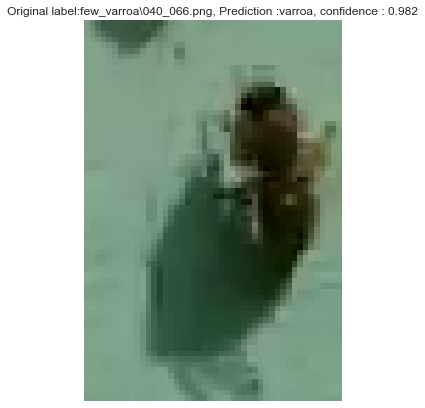

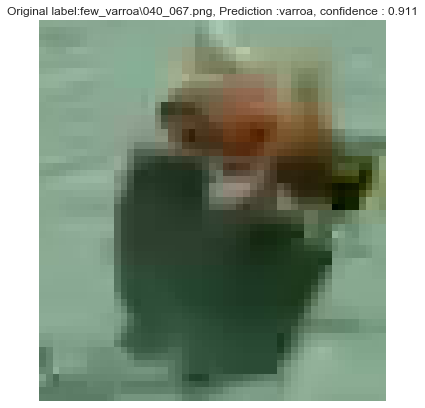

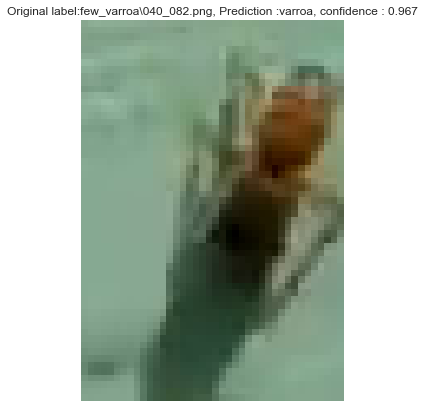

...

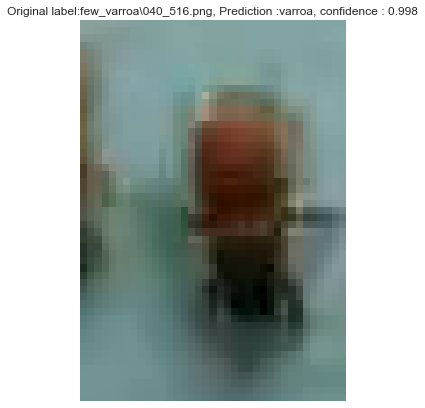

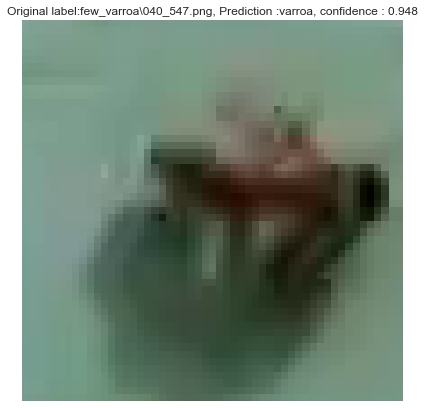

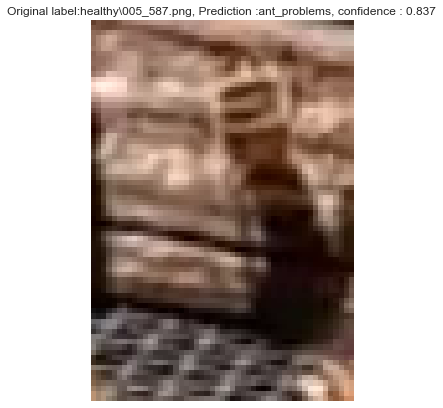

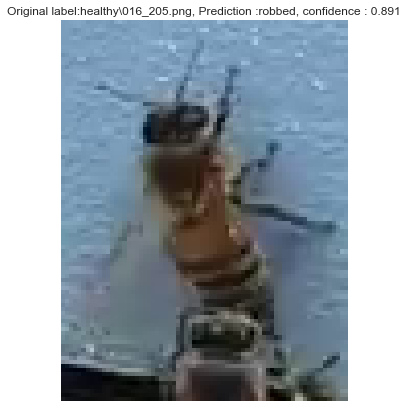

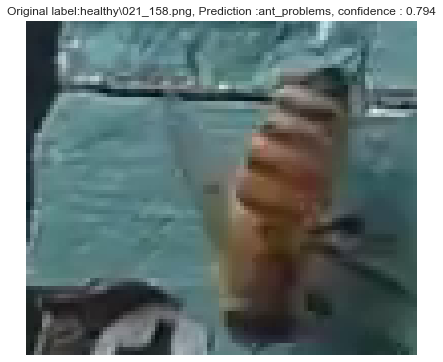

In [584]:
for i in range(len(errors)):
    pred_class = np.argmax(predictions[errors[i]])
    pred_label = idx2label[pred_class]
     
    title = 'Original label:{}, Prediction :{}, confidence : {:.3f}'.format(
        filenames[errors[i]].split('/')[0],
        pred_label,
        predictions[errors[i]][pred_class])
     
    original = image.load_img('{}/{}'.format(test_path,filenames[errors[i]]))
    plt.figure(figsize=[7,7])
    plt.axis('off')
    plt.title(title)
    plt.imshow(original)
    plt.show()

In [585]:
len(errors)

23

Interesting. After looking at the images that my model was wrong in prediction. I can clearly see that most of this errors are between two classes : "few_varroa" and "varroa". For me that 2 classes are very similar and the model has difficulty to recognise. May be if I don't forget to use some of dimensionality reduction techniques like t-SNE to visualize multiple dimensional data in to a simple 2D chart. These pictures from this 2 similar classes wouldn't be wrong if this two calsses was combined. Don't be like Vlado. Don't forget t-SNE.
3 of error images are with another problem. The model make mistake between "few_varroa" and "healthy". May be few_varroa has big varriance or may be I can make better model. Let's try some kernel regularizer in Convolutions layer and see the result.

It is hard to tell that my model will give same result if i was combine two similar classes. If so accuracy for testing will be pretty good but i really don't know the error of dataset. I don't know what accuracy to expect.

In [272]:
def build_model_reg(lr):
    model = Sequential()
    model.add(Conv2D(32, (3,3), activation='relu', padding='same', input_shape=(70,70,3),kernel_regularizer= l2(learning_rate=0.01)))
    model.add(MaxPool2D((2,2),name='block0_pool1'))

    model.add( Conv2D(64,(3,3), activation='relu', padding='same', name='block1_conv1'),kernel_regularizer= l2(learning_rate=0.01))
    model.add(MaxPool2D((2,2),name='block1_pool1'))

    model.add(Flatten())

    model.add(Dense(512, activation='relu'))  
    model.add(Dropout(0.1, name="Dropout_1"))
    model.add(Dense(128, activation='relu'))  
    model.add(Dropout(0.1, name="Dropout_2"))
    model.add(Dense(5, activation = "softmax"))
    
    model.compile(optimizer = Adam(learning_rate = lr),
              loss = CategoricalCrossentropy(),
              metrics = [CategoricalAccuracy()])

    return model
   

In [273]:
classifier_4 = build_model(0.0001)

In [586]:
 train_data_generator_cl_4, val_data_generator_cl_4, test_data_generator_cl_4, batch_size_cl_4 = generate_data_cnn(32, (70,70), True)

Found 14455 images belonging to 5 classes.
Found 358 images belonging to 5 classes.
Found 358 images belonging to 5 classes.


In [275]:
tensorboard_c_4 = TensorBoard(log_dir='logs\c_4')

In [276]:
history_4 = classifier_4.fit_generator(
        train_data_generator_cl_4,
        steps_per_epoch=int(Training_data_len/batch_size_cl_4),
        epochs=epochs,
        validation_data=val_data_generator_cl_4,
        validation_steps=int(Validation_data_len/batch_size_cl_4),
        callbacks= [tensorboard_c_4])

Epoch 1/30
367/367 [==============================] - 279s 760ms/step - loss: 0.9180 - categorical_accuracy: 0.5974 - val_loss: 0.6353 - val_categorical_accuracy: 0.7486
Epoch 2/30
367/367 [==============================] - 277s 754ms/step - loss: 0.5013 - categorical_accuracy: 0.7658 - val_loss: 0.3462 - val_categorical_accuracy: 0.8465
Epoch 3/30
367/367 [==============================] - 267s 727ms/step - loss: 0.4080 - categorical_accuracy: 0.8070 - val_loss: 0.4128 - val_categorical_accuracy: 0.8451
Epoch 4/30
367/367 [==============================] - 264s 720ms/step - loss: 0.3445 - categorical_accuracy: 0.8399 - val_loss: 0.3034 - val_categorical_accuracy: 0.8777
Epoch 5/30
367/367 [==============================] - 264s 720ms/step - loss: 0.3051 - categorical_accuracy: 0.8646 - val_loss: 0.3297 - val_categorical_accuracy: 0.8614
Epoch 6/30
367/367 [==============================] - 269s 734ms/step - loss: 0.2706 - categorical_accuracy: 0.8859 - val_loss: 0.2523 - val_categoric

In [277]:
epochs = 100

In [278]:
history_4 = classifier_4.fit_generator(
        train_data_generator_cl_4,
        steps_per_epoch=int(Training_data_len/batch_size_cl_4),
        epochs=epochs,
        validation_data=val_data_generator_cl_4,
        validation_steps=int(Validation_data_len/batch_size_cl_4),
        callbacks= [tensorboard_c_4],
        initial_epoch=20)

Epoch 21/100
367/367 [==============================] - 269s 733ms/step - loss: 0.0968 - categorical_accuracy: 0.9623 - val_loss: 0.1115 - val_categorical_accuracy: 0.9579
Epoch 22/100
367/367 [==============================] - 270s 735ms/step - loss: 0.0966 - categorical_accuracy: 0.9610 - val_loss: 0.1469 - val_categorical_accuracy: 0.9443
Epoch 23/100
367/367 [==============================] - 273s 743ms/step - loss: 0.0947 - categorical_accuracy: 0.9614 - val_loss: 0.1263 - val_categorical_accuracy: 0.9484
Epoch 24/100
367/367 [==============================] - 269s 733ms/step - loss: 0.0937 - categorical_accuracy: 0.9638 - val_loss: 0.1308 - val_categorical_accuracy: 0.9524
Epoch 25/100
367/367 [==============================] - 291s 792ms/step - loss: 0.0934 - categorical_accuracy: 0.9634 - val_loss: 0.0772 - val_categorical_accuracy: 0.9660
Epoch 26/100
367/367 [==============================] - 271s 738ms/step - loss: 0.0854 - categorical_accuracy: 0.9656 - val_loss: 0.1196 - v

In [279]:
classifier_4.save(models_path + "classifier_4.h5")

orange - validation


gray - train

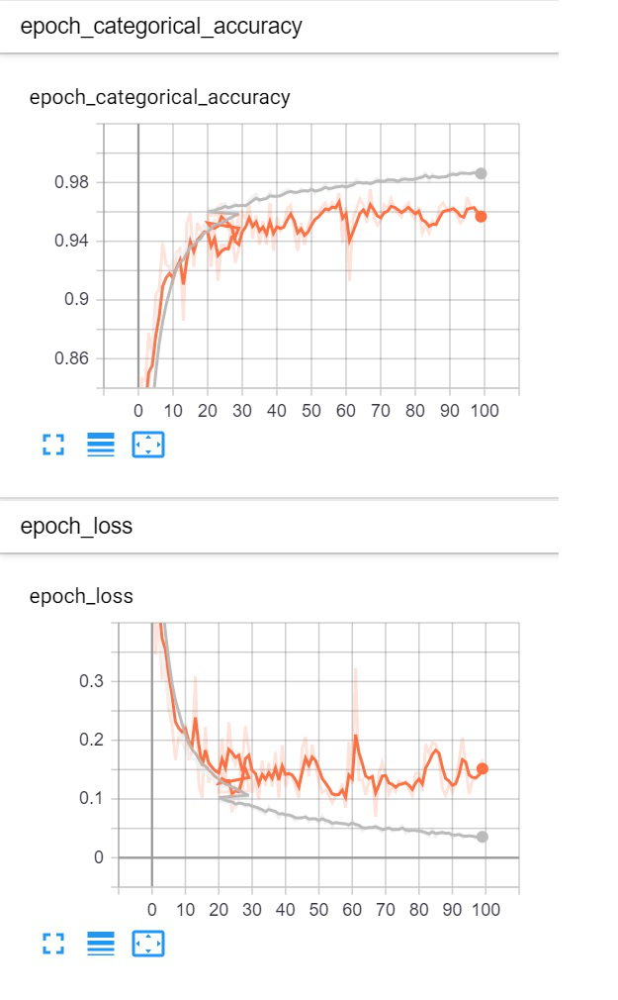

In [587]:
path="project_im/c_4_loss_accuracy.jpg"
display(Image.open(path))

After kernel reguralization the model overfit again. May be if there is a batch normalization between convolutions layer and fully connected layers will be better. It is time to test. 

In [280]:
from tensorflow.keras.layers import BatchNormalization

In [281]:
def build_model_reg(lr):
    model = Sequential()
    model.add(Conv2D(32, (3,3), activation='relu', padding='same', input_shape=(70,70,3),kernel_regularizer= l2(learning_rate=0.01)))
    model.add(MaxPool2D((2,2),name='block0_pool1'))

    model.add( Conv2D(64,(3,3), activation='relu', padding='same', name='block1_conv1'),kernel_regularizer= l2(learning_rate=0.01))
    model.add(MaxPool2D((2,2),name='block1_pool1'))

    model.add(Flatten())
    model.add(BatchNormalization())

    model.add(Dense(512, activation='relu'))  
    model.add(Dropout(0.1, name="Dropout_1"))
    model.add(Dense(128, activation='relu'))  
    model.add(Dropout(0.1, name="Dropout_2"))
    model.add(Dense(5, activation = "softmax"))
    
    model.compile(optimizer = Adam(learning_rate = lr),
              loss = CategoricalCrossentropy(),
              metrics = [CategoricalAccuracy()])

    return model
   

In [282]:
classifier_5 = build_model(0.0001)

In [588]:
train_data_generator_cl_5, val_data_generator_cl_5, test_data_generator_cl_5, batch_size_cl_5 = generate_data_cnn(32, (70,70), True)

Found 14455 images belonging to 5 classes.
Found 358 images belonging to 5 classes.
Found 358 images belonging to 5 classes.


In [284]:
tensorboard_c_5 = TensorBoard(log_dir='logs\c_5')

In [285]:
epochs = 50

In [286]:
history_5 = classifier_5.fit_generator(
        train_data_generator_cl_5,
        steps_per_epoch=int(Training_data_len/batch_size_cl_5),
        epochs=epochs,
        validation_data=val_data_generator_cl_5,
        validation_steps=int(Validation_data_len/batch_size_cl_5),
        callbacks= [tensorboard_c_5])

Epoch 1/50
367/367 [==============================] - 296s 806ms/step - loss: 0.8201 - categorical_accuracy: 0.6403 - val_loss: 0.6592 - val_categorical_accuracy: 0.7582
Epoch 2/50
367/367 [==============================] - 335s 914ms/step - loss: 0.4804 - categorical_accuracy: 0.7631 - val_loss: 0.4168 - val_categorical_accuracy: 0.8125
Epoch 3/50
367/367 [==============================] - 320s 871ms/step - loss: 0.3892 - categorical_accuracy: 0.8069 - val_loss: 0.4607 - val_categorical_accuracy: 0.7908
Epoch 4/50
367/367 [==============================] - 315s 858ms/step - loss: 0.3468 - categorical_accuracy: 0.8268 - val_loss: 0.2912 - val_categorical_accuracy: 0.8736
Epoch 5/50
367/367 [==============================] - 321s 875ms/step - loss: 0.3201 - categorical_accuracy: 0.8406 - val_loss: 0.2967 - val_categorical_accuracy: 0.8668
Epoch 6/50
367/367 [==============================] - 333s 906ms/step - loss: 0.2840 - categorical_accuracy: 0.8672 - val_loss: 0.7164 - val_categoric

Epoch 49/50
367/367 [==============================] - 277s 755ms/step - loss: 0.0793 - categorical_accuracy: 0.9674 - val_loss: 0.1196 - val_categorical_accuracy: 0.9565
Epoch 50/50
367/367 [==============================] - 274s 747ms/step - loss: 0.0742 - categorical_accuracy: 0.9698 - val_loss: 0.1527 - val_categorical_accuracy: 0.9375


In [287]:
classifier_5.save(models_path + "classifier_5.h5")

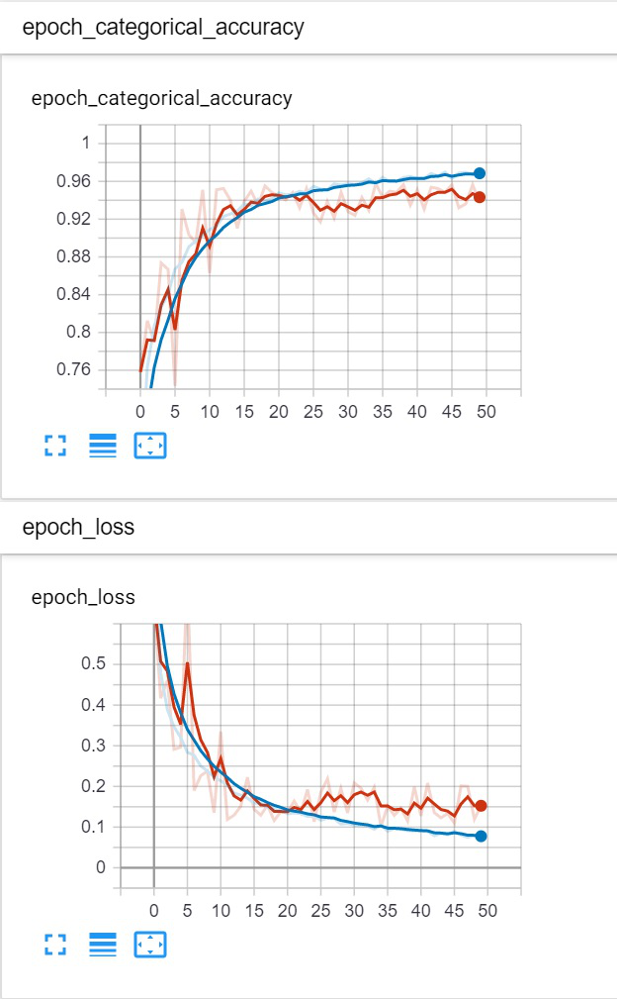

In [589]:
path="project_im/c_5_loss_accuracy.jpg"
display(Image.open(path))

Now look better, but not enough. If i increase the dropout and set early stopping may be will be better.

In [316]:
def build_model_reg(lr):
    model = Sequential()
    model.add(Conv2D(32, (3,3), activation='relu', padding='same', input_shape=(70,70,3),kernel_regularizer= l2(learning_rate=0.01)))
    model.add(MaxPool2D((2,2),name='block0_pool1'))

    model.add( Conv2D(64,(3,3), activation='relu', padding='same', name='block1_conv1'),kernel_regularizer= l2(learning_rate=0.01))
    model.add(MaxPool2D((2,2),name='block1_pool1'))

    model.add(Flatten())
    model.add(BatchNormalization())

    model.add(Dense(512, activation='relu'))  
    model.add(Dropout(0.4, name="Dropout_1"))
    model.add(Dense(128, activation='relu'))  
    model.add(Dropout(0.4, name="Dropout_2"))
    model.add(Dense(5, activation = "softmax"))
    
    model.compile(optimizer = Adam(learning_rate = lr),
              loss = CategoricalCrossentropy(),
              metrics = [CategoricalAccuracy()])

    return model
   

In [317]:
classifier_6 = build_model(0.0001)

In [590]:
train_data_generator_cl_6, val_data_generator_cl_6, test_data_generator_cl_6, batch_size_cl_6 = generate_data_cnn(32, (70,70), True)

Found 14455 images belonging to 5 classes.
Found 358 images belonging to 5 classes.
Found 358 images belonging to 5 classes.


In [320]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

In [321]:
callbacks_6 = [EarlyStopping(monitor='val_loss', patience=2),
            ModelCheckpoint(filepath='Models/c_6.h5', monitor='val_loss', save_best_only=True),
             TensorBoard(log_dir='logs\c_6') ]

In [322]:
epochs = 30

In [323]:
history_6 = classifier_6.fit_generator(
        train_data_generator_cl_6,
        steps_per_epoch=int(Training_data_len/batch_size_cl_6),
        epochs=epochs,
        validation_data=val_data_generator_cl_6,
        validation_steps=int(Validation_data_len/batch_size_cl_6),
        callbacks= callbacks_6)

Epoch 1/30
367/367 [==============================] - 290s 790ms/step - loss: 0.8269 - categorical_accuracy: 0.6278 - val_loss: 0.5229 - val_categorical_accuracy: 0.7853
Epoch 2/30
367/367 [==============================] - 286s 779ms/step - loss: 0.4762 - categorical_accuracy: 0.7623 - val_loss: 0.8332 - val_categorical_accuracy: 0.6209
Epoch 3/30
367/367 [==============================] - 283s 770ms/step - loss: 0.3973 - categorical_accuracy: 0.8086 - val_loss: 0.4012 - val_categorical_accuracy: 0.8261
Epoch 4/30
367/367 [==============================] - 277s 755ms/step - loss: 0.3429 - categorical_accuracy: 0.8358 - val_loss: 0.2749 - val_categorical_accuracy: 0.8818
Epoch 5/30
367/367 [==============================] - 280s 764ms/step - loss: 0.3077 - categorical_accuracy: 0.8538 - val_loss: 0.2732 - val_categorical_accuracy: 0.8696
Epoch 6/30
367/367 [==============================] - 278s 756ms/step - loss: 0.2738 - categorical_accuracy: 0.8789 - val_loss: 0.3044 - val_categoric

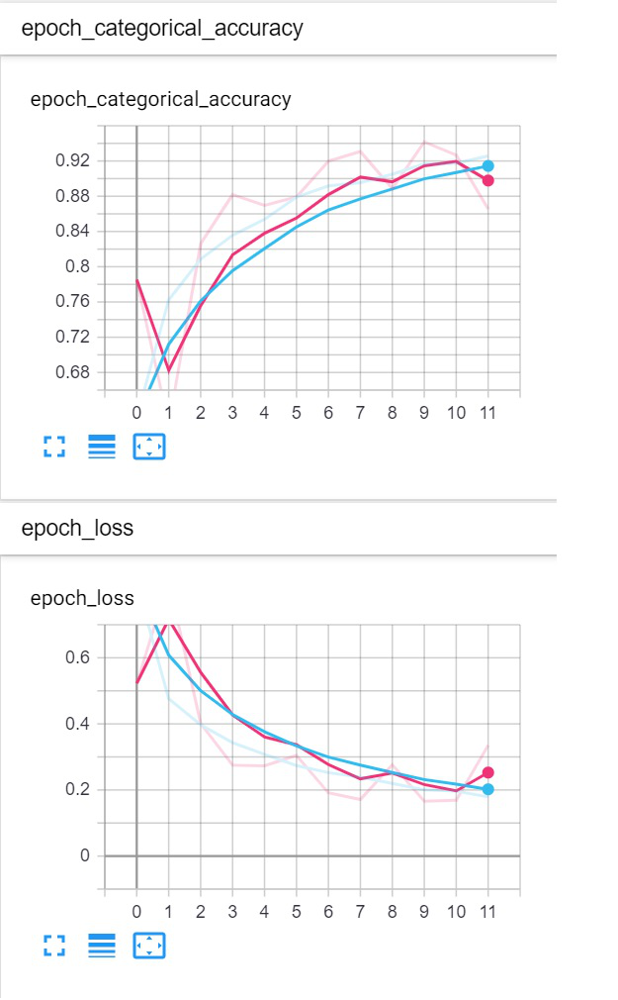

In [591]:
path="project_im/c_6_loss_accuracy.jpg"
display(Image.open(path))

358/358 [==============================] - 15s 41ms/step
Errors = 40/358


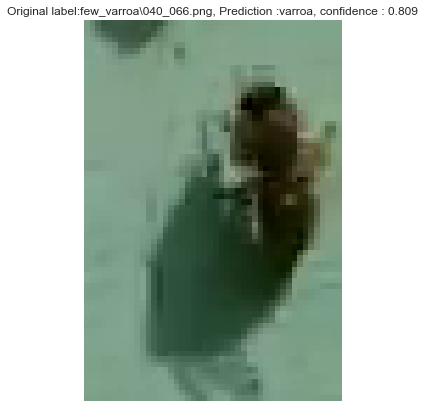

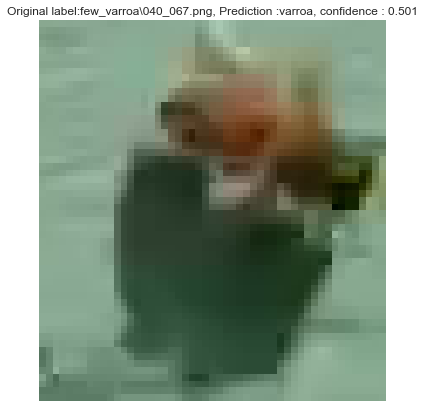

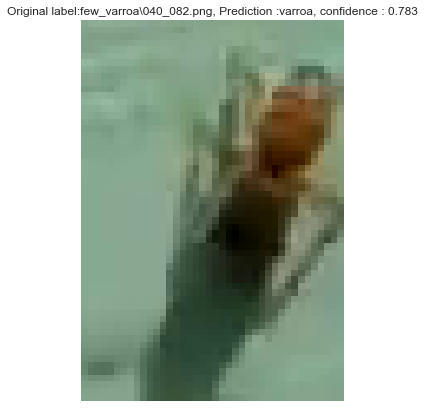

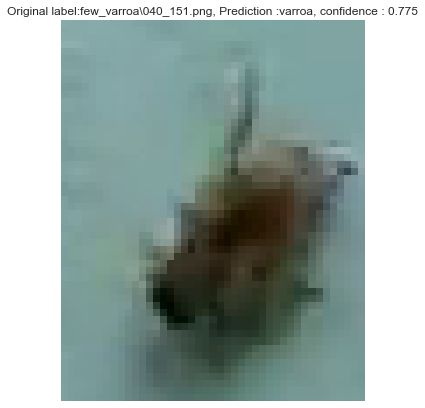

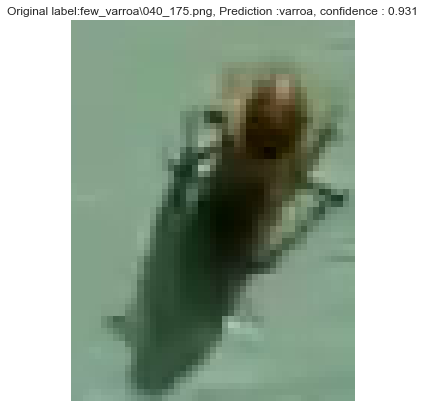

...

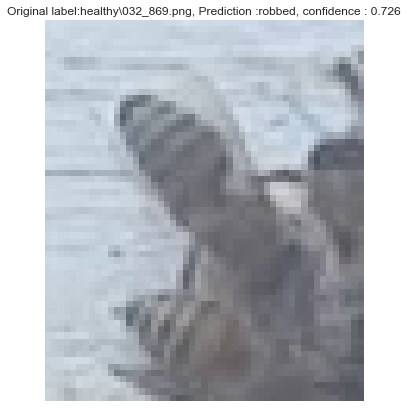

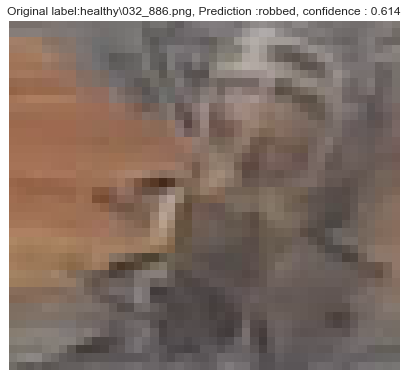

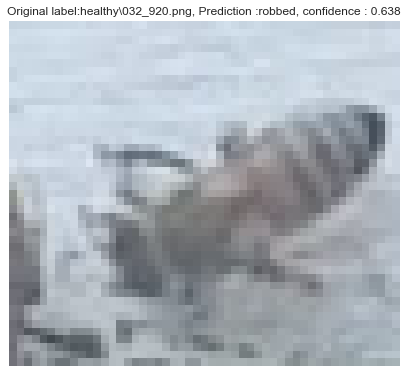

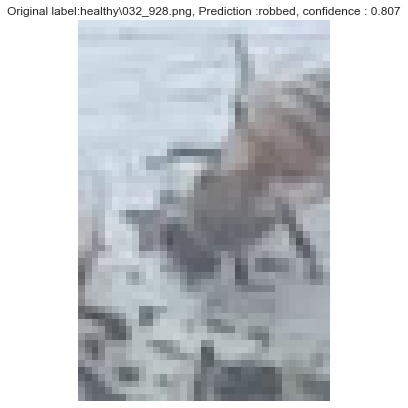

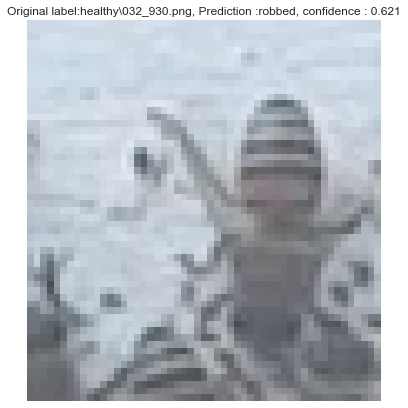

In [593]:
filenames = test_data_generator_cl_6.filenames
ground_truth = test_data_generator_cl_6.classes
label2index = test_data_generator_cl_6.class_indices
idx2label = dict((v,k) for k,v in label2index.items())
predictions = classifier_6.predict_generator(test_data_generator_cl_6, steps=test_data_generator_cl_6.samples/test_data_generator_cl_6.batch_size,verbose=1)
predicted_classes = np.argmax(predictions,axis=1)
errors = np.where(predicted_classes != ground_truth)[0]
print("Errors = {}/{}".format(len(errors),test_data_generator_cl_6.samples))
for i in range(len(errors)):
    pred_class = np.argmax(predictions[errors[i]])
    pred_label = idx2label[pred_class]
     
    title = 'Original label:{}, Prediction :{}, confidence : {:.3f}'.format(
        filenames[errors[i]].split('/')[0],
        pred_label,
        predictions[errors[i]][pred_class])
     
    original = image.load_img('{}/{}'.format(test_path,filenames[errors[i]]))
    plt.figure(figsize=[7,7])
    plt.axis('off')
    plt.title(title)
    plt.imshow(original)
    plt.show()

All graphs can see in log directory. 

<h3><center>I.CONCLUSION</center></h3>

Satisfactory results are obtained using not very sophisticated architecture. Given the results, I would choose a classifier 3. There are a number of other suitable architectures to try, but due to the lack of technological time and lack of access to a video card, these options are appropriate at this stage. The project can be expanded by trying out new architectures and training new models. All models can download from [4]

<h3><center>REFERENCES</center></h3>

[1]. https://www.kaggle.com/jenny18/honey-bee-annotated-images

[2]. https://en.wikipedia.org/wiki/Varroa

[3]. http://entnemdept.ufl.edu/creatures/misc/bees/small_hive_beetle.htm#top

[4] https://drive.google.com/open?id=1q5r6SbaVQ0bX8i24ltcRZhxk29zriN0Z